# Rainfall Weather Forecasting-
__Project Description__<br>
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23

- Date  - The date of observation
- Location  -The common name of the location of the weather station
- MinTemp  -The minimum temperature in degrees celsius
- MaxTemp -The maximum temperature in degrees celsius
- Rainfall  -The amount of rainfall recorded for the day in mm
- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
- Sunshine  -The number of hours of bright sunshine in the day.
- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
- WindDir9am -Direction of the wind at 9am
- WindDir3pm -Direction of the wind at 3pm
- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
- Humidity9am -Humidity (percent) at 9am
- Humidity3pm -Humidity (percent) at 3pm
- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
- Cloud9am - Fraction of sky obscured by cloud at 9am. 
- Cloud3pm -Fraction of sky obscured by cloud 
- Temp9am-Temperature (degrees C) at 9am
- Temp3pm -Temperature (degrees C) at 3pm
- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

In [2]:
#importing dataset
df=pd.read_csv('weatherAUS.csv')

In [3]:
#reading top 5 rows
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
#reading alast 5 rows
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [6]:
print("The Shape of the dataset is:",df.shape)

The Shape of the dataset is: (8425, 23)


In our dataset we got 8425 rows and 23 columns , letsc check for duplicate entries


In [7]:
df.drop_duplicates(inplace=True)
print(" AFter dropping  dulicates the Shape of the dataset is:",df.shape)

 AFter dropping  dulicates the Shape of the dataset is: (6762, 23)


With the drop_duplicates option I got rid of all the duplicate values present in our dataset.

In [8]:
#checing columns
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

Let's check the data types and missing values in the various columns.



In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

__Here after analysis, it is pretty evident that some of these contain a lot of null values, so we will be dropping those columns ,depending upon their contribution towards the label column__<br>
Also the objectdatatype of Date clumn so we need to converts its datatype from object to date type


In [10]:
df.Date = pd.to_datetime(df.Date)


In [11]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [12]:
df.drop('Date', inplace=True, axis=1)


In [13]:
print(df.shape)
df.head()

(6762, 25)


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [14]:
#Checking for null values
df.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Year                0
Month               0
Day                 0
dtype: int64

In [15]:
df.isnull().sum().sum()

16513

- Evaporation has 2921 <br>
- Sunshine  has 3236 null values so we can drop these 2 columns.

In [16]:
df = df.drop(["Evaporation","Sunshine"], axis =1)

In [17]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [18]:
print(df['Location'].nunique())
df['Location'].value_counts()
#we can Location column as well

12


PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64

## Filling Null Values - 
__For categorica columns I am going to  use Mode methos__<br>
__For Continous columns I am going to imputation technique__<br>

In [18]:
numeric_cols =df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df.select_dtypes('object').columns.tolist()


In [19]:
numeric_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [20]:
categorical_cols

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

Also we shall see the no. of missing values before we impute the Nans this also ensure that ou methods worked correctly.

In [21]:
df[numeric_cols].isna().sum().sort_values(ascending=False)


Cloud3pm         1902
Cloud9am         1866
Pressure3pm      1311
Pressure9am      1308
WindGustSpeed     942
Rainfall          138
WindSpeed3pm      100
Humidity3pm        96
Temp3pm            92
MinTemp            70
WindSpeed9am       63
MaxTemp            57
Humidity9am        54
Temp9am            51
Year                0
Month               0
Day                 0
dtype: int64

In [22]:
from sklearn.impute import SimpleImputer


In [23]:
imputer = SimpleImputer(strategy = 'mean') 

In [24]:
df[numeric_cols]=imputer.fit_transform(df[numeric_cols]) 


In [25]:
df[numeric_cols].isna().sum().sort_values(ascending=False)


MinTemp          0
Pressure3pm      0
Month            0
Year             0
Temp3pm          0
Temp9am          0
Cloud3pm         0
Cloud9am         0
Pressure9am      0
MaxTemp          0
Humidity3pm      0
Humidity9am      0
WindSpeed3pm     0
WindSpeed9am     0
WindGustSpeed    0
Rainfall         0
Day              0
dtype: int64

__Successfully filled the Numerical columns Missing values__<br>
__Filling Categorical columns__


In [26]:
imputercat = SimpleImputer(strategy = 'most_frequent')


In [27]:
df[categorical_cols].isna().sum().sort_values(ascending=False)


WindGustDir     942
WindDir9am      794
WindDir3pm      294
RainToday       138
RainTomorrow    138
Location          0
dtype: int64

In [28]:
df[categorical_cols]=imputercat.fit_transform(df[categorical_cols])


In [29]:
df[categorical_cols].isna().sum().sort_values(ascending=False)


Location        0
WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

In [30]:
df.isna().sum().sum()

0

In [31]:
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.098345,2.780148,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,4.336806,4.320988,17.895038,22.708561,2012.052203,6.462141,15.737208
std,5.540667,6.130123,10.482769,13.376457,9.787577,9.548634,17.182700,18.498341,6.027914,5.967638,2.474649,2.323276,5.722411,5.971845,2.301057,3.377471,8.793898
min,-2.000000,8.200000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,2008.000000,1.000000,1.000000
25%,9.000000,19.600000,0.000000,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000,2010.000000,4.000000,8.000000
50%,13.109145,23.500000,0.000000,38.977663,11.000000,17.000000,68.000000,50.000000,1017.626311,1015.119923,4.336806,4.320988,17.900000,22.300000,2012.000000,6.000000,16.000000
75%,17.400000,28.400000,1.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,2014.000000,9.000000,23.000000
max,28.500000,45.500000,371.000000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,2017.000000,12.000000,31.000000


__Observations__
- Columns like Rainfall,WindGustSpeed, WindSpeed9am,WindSpeed3pm are having big difference between 75% and MAx aues that means Skewness and outliers ar present in the Columns.<br>


### Exploratory Data Analysis (EDA)

Visualising and exploring each column of the dataset


In [32]:
def generate_countplot(x):

    plt.figure(figsize=(8,7))
    sns.countplot(x)
    plt.xticks(rotation=90)
    plt.tight_layout()

    return plt.show()




I have defined a function here so that I can plot countplot for categorical column by just calling the function.

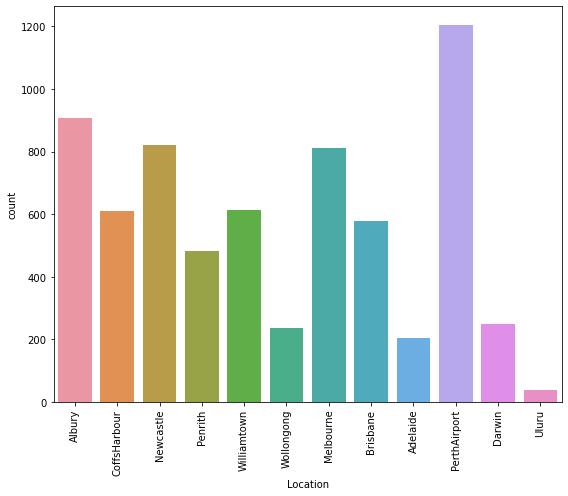

In [33]:
#exploring Location column
generate_countplot(df['Location'])

Location PerthAirport  has the most frequency and Uluru has the least frequency

In [34]:
categorical_cols

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

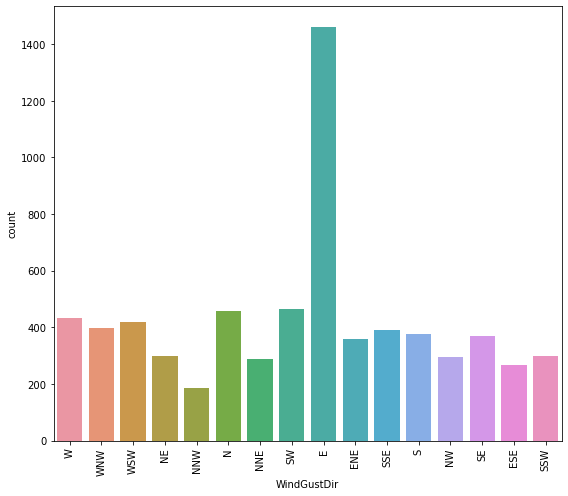

In [35]:
generate_countplot(df['WindGustDir'])

The direction of the strongest wind gust is the highest in east and lowest in NNW direction

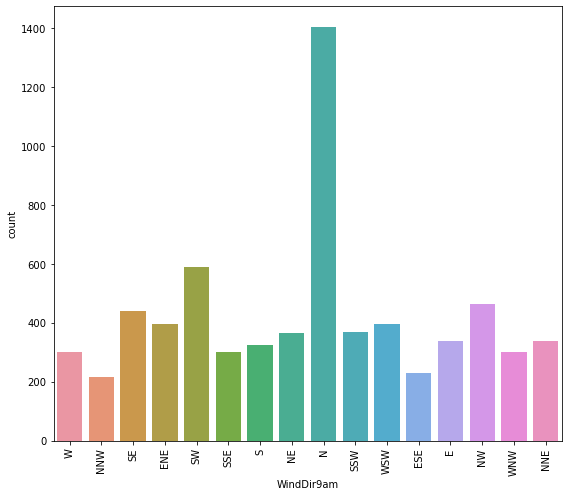

In [36]:
generate_countplot(df['WindDir9am'])

Direction of the wind at 9am is the highest at North Direction and lowest at NNW Direction

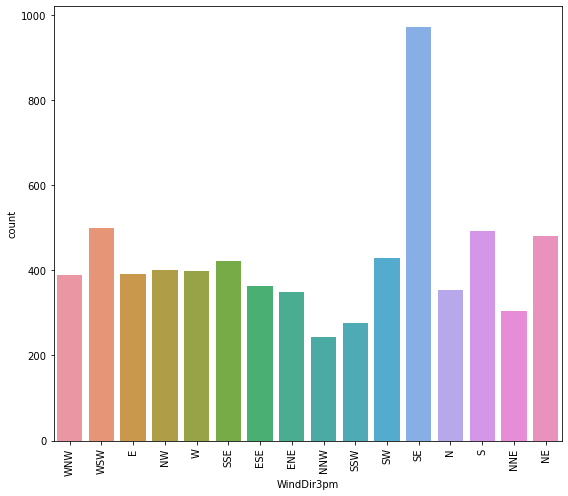

In [37]:
generate_countplot(df['WindDir3pm'])

Direction of the wind at 3pm is highest at SE direction and lowest at NNW direction

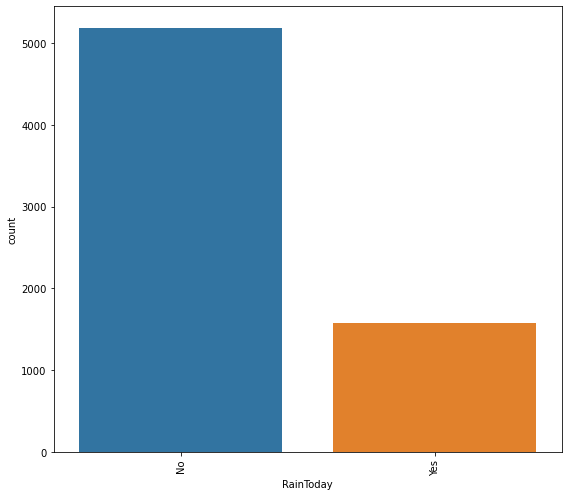

In [38]:
generate_countplot(df['RainToday'])

RainToday is our Label Column and it seems imblance which we handle later in the project.

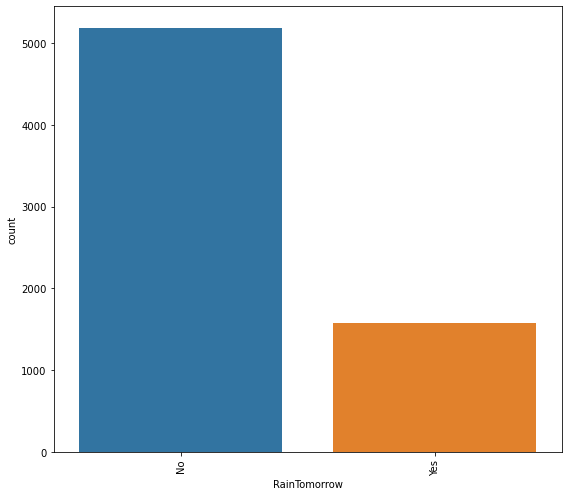

In [39]:
generate_countplot(df['RainTomorrow'])

__Exploring Numerical Columns__<br>
__Histogram and Boxplot of numerical columns__

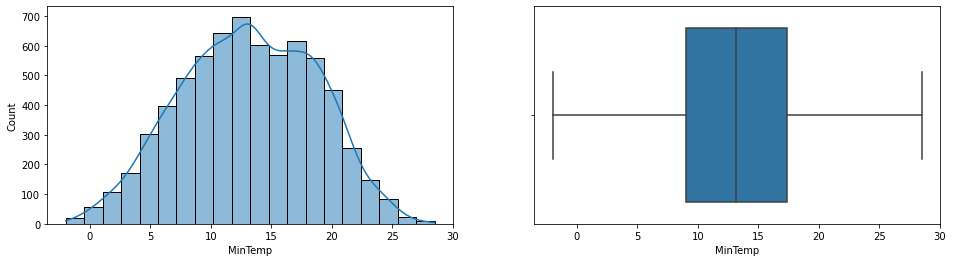

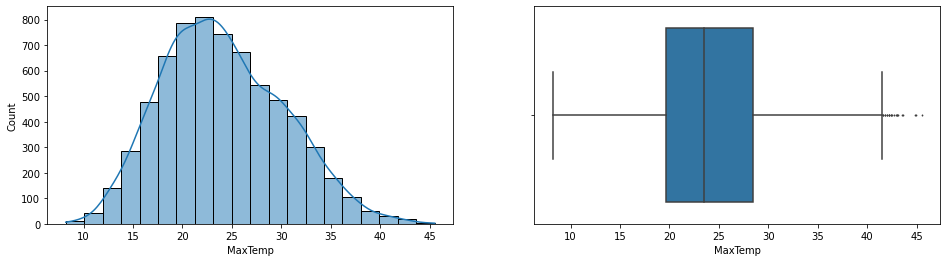

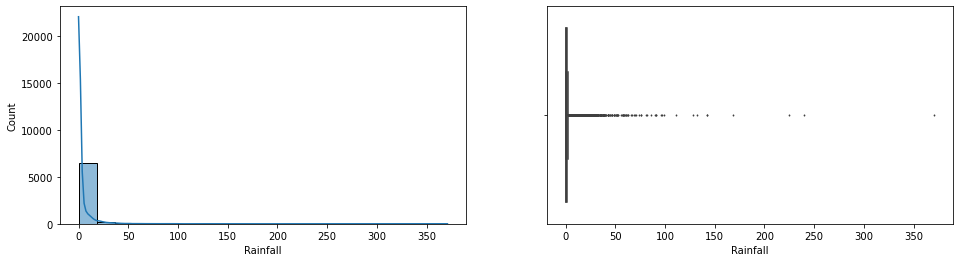

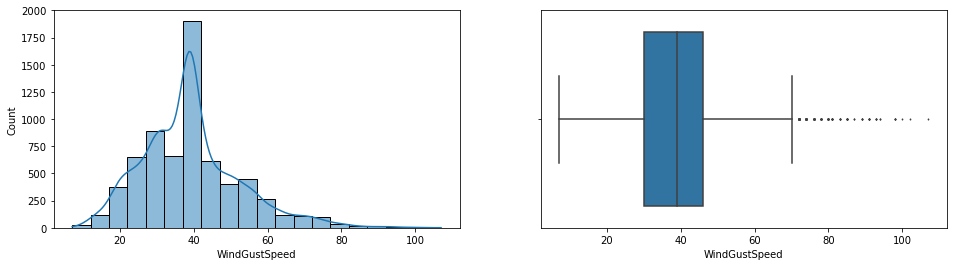

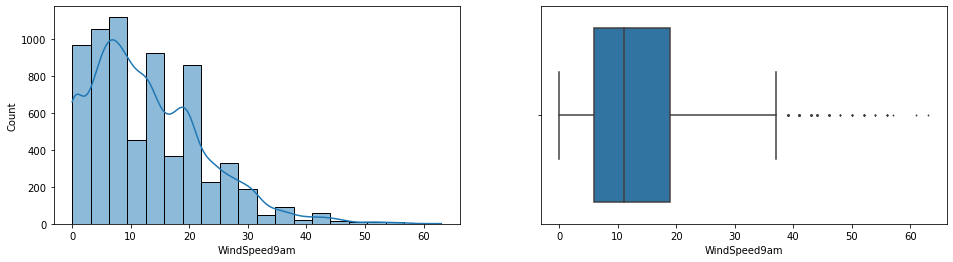

...

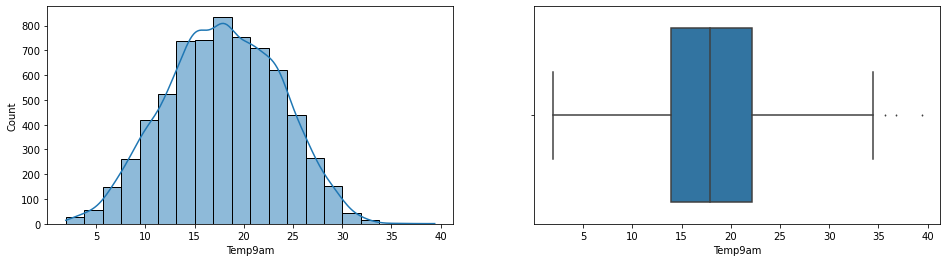

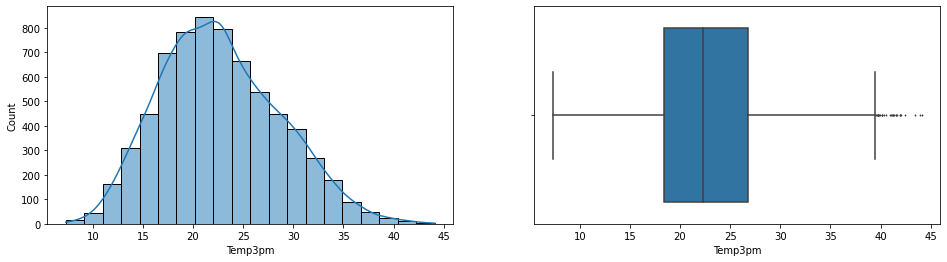

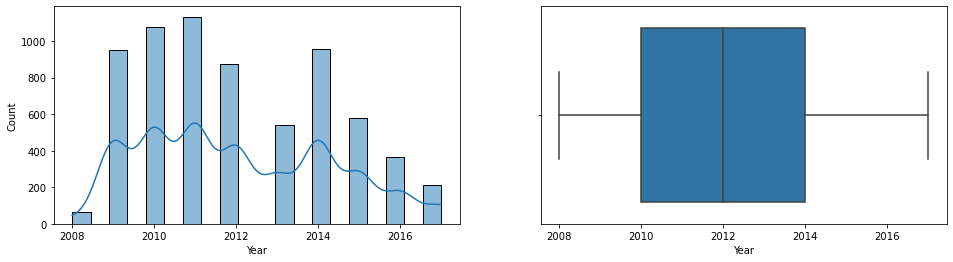

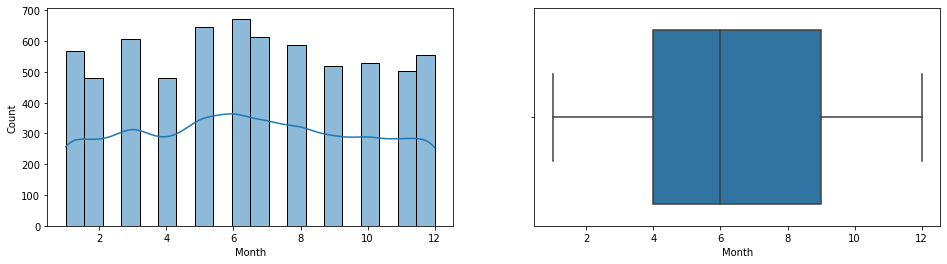

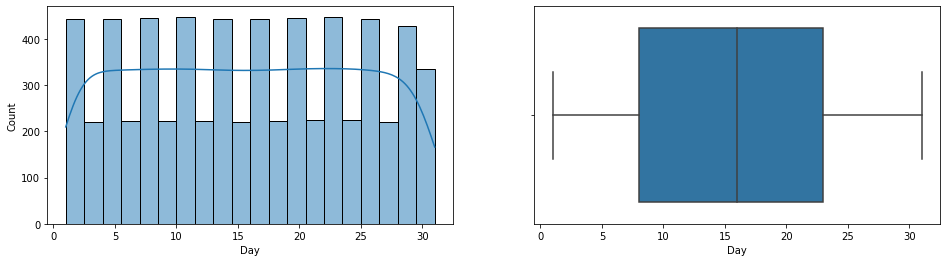

In [40]:
for col in numeric_cols:
    fig, ax = plt.subplots(1,2, figsize=(16, 4))

    sns.histplot(df[col], bins=20, kde=True, ax=ax[0])
    
    sns.boxplot(df[col], fliersize=1, ax=ax[1])

### Observations<br>
__All numeric columns have some few outliers as we can see skewness in histplot and outliers in boxplot except; Humididty3pm, WIndGustSpeed, Year, Month and Day. Outliers will be handle later__<br>

__Numerical cols are not normally distributed.__

### Bivariate Analysisis


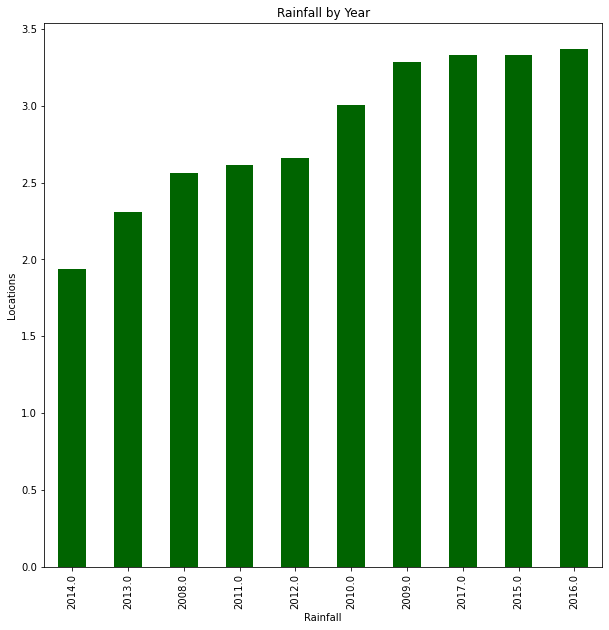

In [42]:
plt.figure(figsize=(10, 10))

location_rain = df.groupby('Year')['Rainfall'].mean()\
                                                 .sort_values()\
                                                 .plot(kind='bar', color= 'darkgreen')
plt.title('Rainfall by Year')
plt.xlabel('Rainfall', fontsize=10)
plt.ylabel('Locations', fontsize=10)
plt.show()

From above barplot we can clearly see that year 2016 had recieved the highest rainfall 

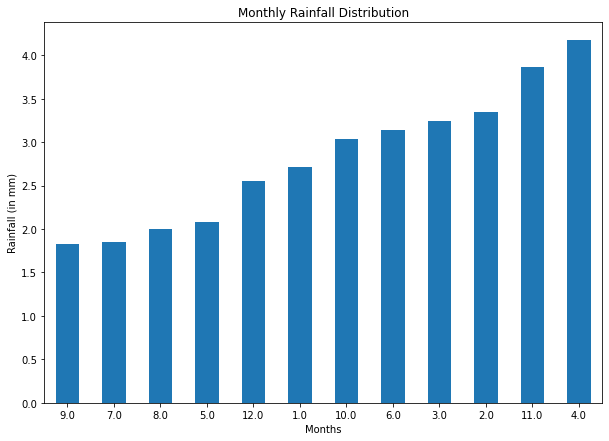

In [43]:
plt.figure(figsize=(10,7))
df.groupby('Month')['Rainfall'].mean()\
                               .sort_values()\
                               .plot(kind='bar')

plt.title('Monthly Rainfall Distribution', fontsize=12)
plt.xlabel('Months')
plt.ylabel('Rainfall (in mm)')

plt.xticks(rotation=0)

plt.show()

from above barplot we can clearly see that month april got the highest rainfall and september month has the lowest rainfall

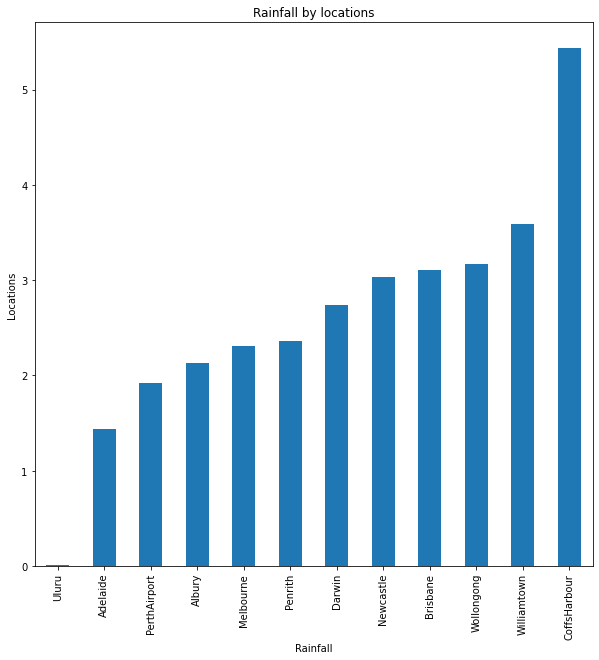

In [44]:
plt.figure(figsize=(10, 10))

location_rain = df.groupby('Location')['Rainfall'].mean()\
                                                 .sort_values()\
                                                 .plot(kind='bar')
plt.title('Rainfall by locations')
plt.xlabel('Rainfall', fontsize=10)
plt.ylabel('Locations', fontsize=10)
plt.show()

CoffsHarbour is the location where rainfall was the highest and Uluru is like not rainfall at all

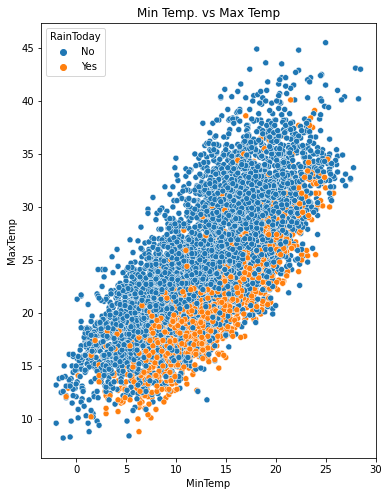

In [45]:
plt.figure(figsize=(6,8))
plt.title('Min Temp. vs Max Temp')
sns.scatterplot(x='MinTemp',y='MaxTemp',hue='RainToday',data=df)
plt.show()

The chances of Raintoday ddepends on MinTem as we can see whenever MIntemp s increasing rainToday is happening

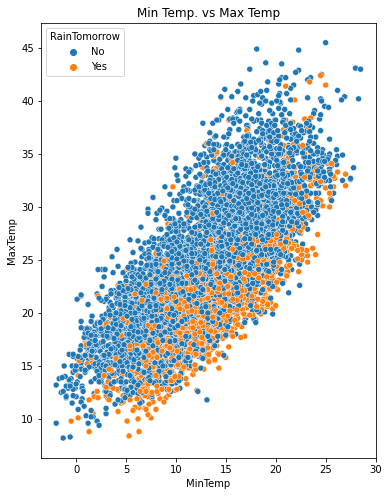

In [46]:
plt.figure(figsize=(6,8))
plt.title('Min Temp. vs Max Temp')
sns.scatterplot(x='MinTemp',y='MaxTemp',hue='RainTomorrow',data=df)
plt.show()

Similarly with the RainTomorrow column.

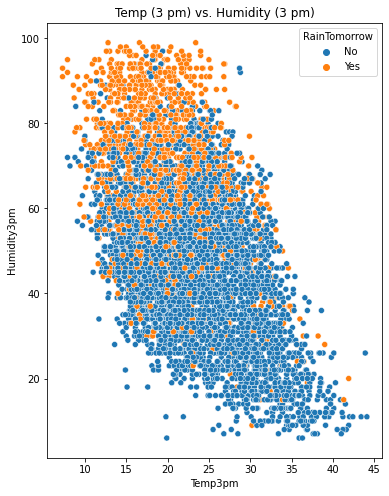

In [42]:
plt.figure(figsize=(6,8))
plt.title('Temp (3 pm) vs. Humidity (3 pm)')
sns.scatterplot(x='Temp3pm',y='Humidity3pm',hue='RainTomorrow',data=df)
plt.show()

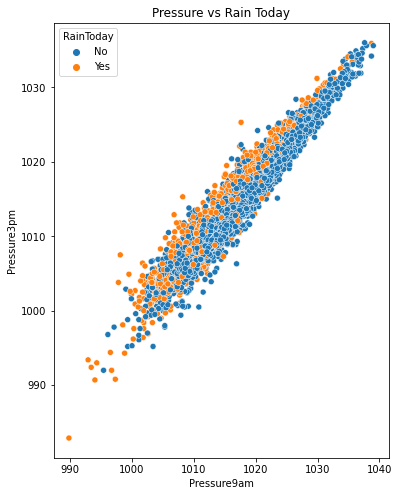

In [49]:
plt.figure(figsize=(6,8))
plt.title('Pressure vs Rain Today')
sns.scatterplot(x='Pressure9am',y='Pressure3pm',hue='RainToday',data=df)
plt.show()

As soon as Pressure is incraesing chances of rain is also increasing

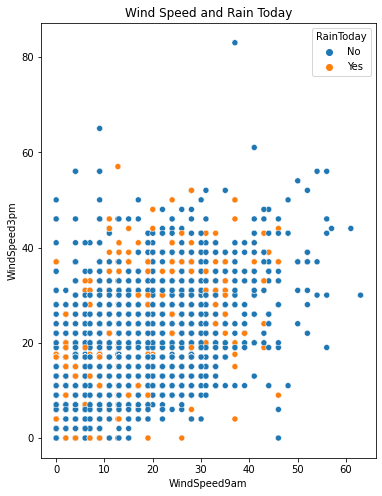

In [50]:
plt.figure(figsize=(6,8))
plt.title('Wind Speed and Rain Today')
sns.scatterplot(x='WindSpeed9am',y='WindSpeed3pm',hue='RainToday',data=df)
plt.show()

__Location vs Explore  Temp Cols__


In [51]:
location_Temp9am_3pm = df.groupby('Location')['Temp9am', 'Temp3pm'].mean()
location_Temp9am_3pm = location_Temp9am_3pm.reset_index()
location_Temp9am_3pm.head()

,Location,Temp9am,Temp3pm
0,Adelaide,15.861951,20.189756
1,Albury,14.555347,21.673539
2,Brisbane,20.685656,23.977059
3,CoffsHarbour,19.611620,21.746168
4,Darwin,25.601200,30.668000


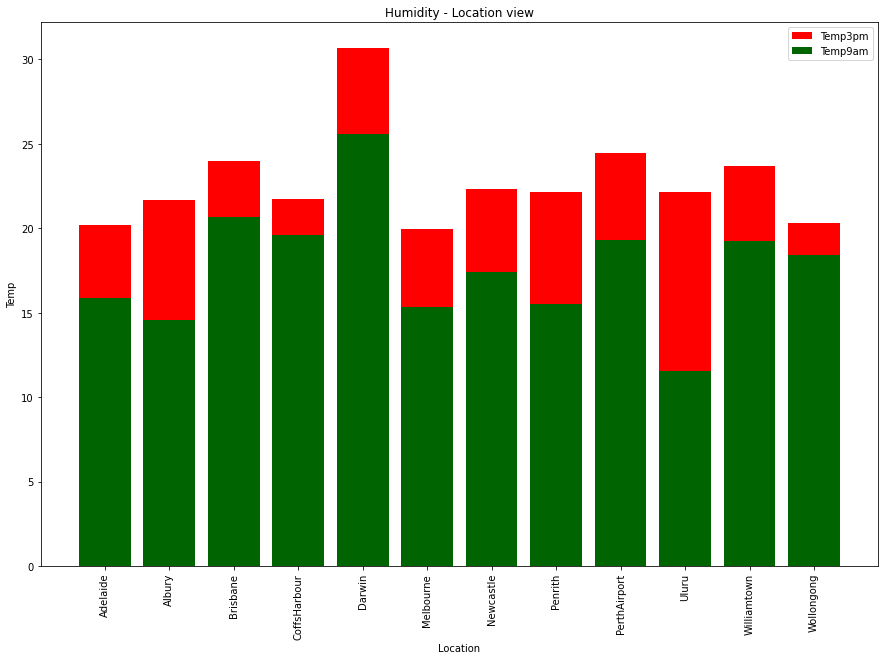

In [52]:
x = location_Temp9am_3pm.loc[:, 'Location']
y1 = location_Temp9am_3pm['Temp9am']
y2 = location_Temp9am_3pm['Temp3pm']

plt.figure(figsize=(15, 10))

plt.bar(x, y2, color='red', label='Temp3pm')
plt.bar(x, y1, color='darkgreen', label='Temp9am')

plt.xticks(rotation=90)
plt.xlabel('Location')
plt.ylabel('Temp')
plt.title('Humidity - Location view')

plt.legend()
plt.show()

__Observation__
- In contrast to Dawin rerording the lowest pressure for both pressure at 9am and pressure at 3pm

- Dawin recorded the highest temperature of 27 and 33 for Temp at 9am and Temp at 3pm respectively.

- Mebourne recorded the least temperature for both Temp at 9am and Temp at 3pm

- Overall Temp at 3pm is higher than Temp at 9am

__Location Vs Min/Max cols__


In [53]:
loctn_Temp = df.groupby('Location')['MinTemp', 'MaxTemp'].mean()
loctn_Temp = loctn_Temp.reset_index()
loctn_Temp.head()

,Location,MinTemp,MaxTemp
0,Adelaide,10.980000,21.435122
1,Albury,10.062123,22.828767
2,Brisbane,15.368928,25.462691
3,CoffsHarbour,13.704107,23.275284
4,Darwin,21.324800,31.966800


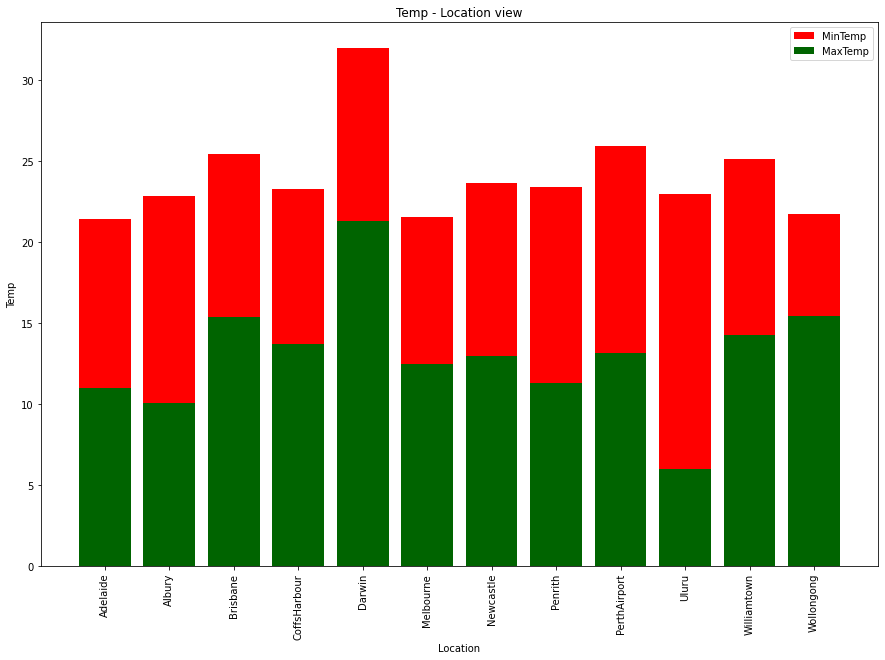

In [54]:
x = loctn_Temp.loc[:, 'Location']
y1 = loctn_Temp['MinTemp']
y2 = loctn_Temp['MaxTemp']

plt.figure(figsize=(15, 10))

plt.bar(x, y2, color='red', label='MinTemp')
plt.bar(x, y1, color='darkgreen', label='MaxTemp')

plt.xticks(rotation=90)
plt.xlabel('Location')
plt.ylabel('Temp')
plt.title('Temp - Location view')

plt.legend()
plt.show()

__Observation__
- Darwin temprature registered the highest MinTem of 23 while the highest MaxTem of 35 was recorded by Dawin temperature.

- Just like Temp9am and Temp3pm, the least MaxTem and MinTem was registered by Melbourne temperature.

__Location Vs humidity cols__


In [55]:
humid_loca = df.groupby('Location')['Humidity9am', 'Humidity3pm'].mean()
humid_loca = humid_loca.reset_index()
humid_loca.head()

,Location,Humidity9am,Humidity3pm
0,Adelaide,59.029268,44.809756
1,Albury,72.604190,47.062845
2,Brisbane,66.474105,54.179507
3,CoffsHarbour,66.314239,60.647246
4,Darwin,63.828000,43.932000


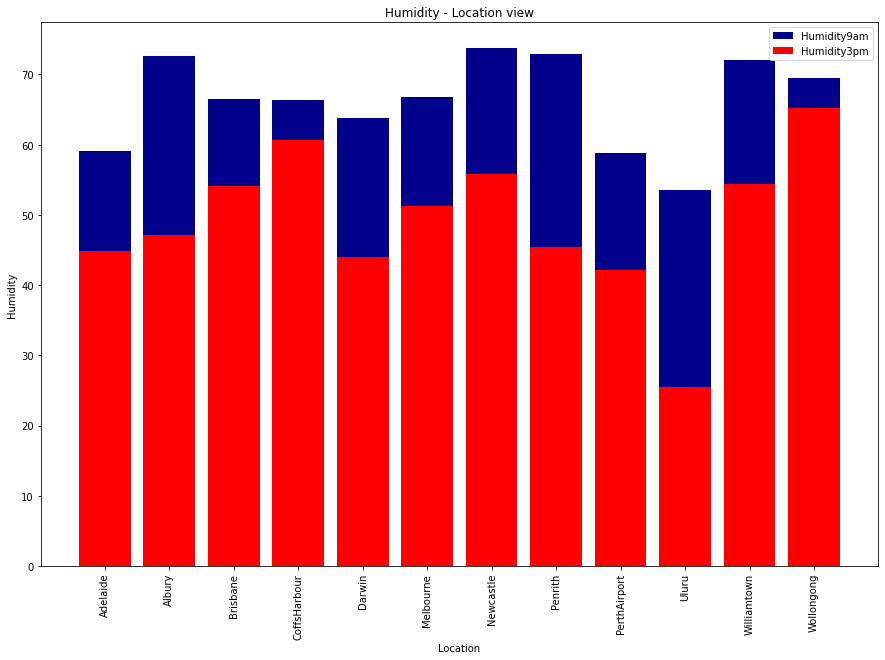

In [56]:
x = humid_loca.loc[:, 'Location']
y1 = humid_loca['Humidity9am']
y2 = humid_loca['Humidity3pm']

plt.figure(figsize=(15, 10))

plt.bar(x, y1, color='darkblue', label='Humidity9am')
plt.bar(x, y2, color='red', label='Humidity3pm')

plt.xticks(rotation=90)
plt.xlabel('Location')
plt.ylabel('Humidity')
plt.title('Humidity - Location view')

plt.legend()
plt.show()

__Observation__
- The humidity of Newcastle at 9am recorded has the highest humudity of aprox 85

- On the other hand Wollongong and CoffisHarbour humidity at 3pm are the highest.

__Location Vs Windspeed cols__

In [57]:
wind_loca = df.groupby('Location')['WindSpeed9am', 'WindSpeed3pm'].mean()
wind_loca = wind_loca.reset_index()
wind_loca.head()

,Location,WindSpeed9am,WindSpeed3pm
0,Adelaide,11.317073,16.404878
1,Albury,8.245145,14.294061
2,Brisbane,6.031088,9.682456
3,CoffsHarbour,15.385539,20.509235
4,Darwin,16.012000,20.204000


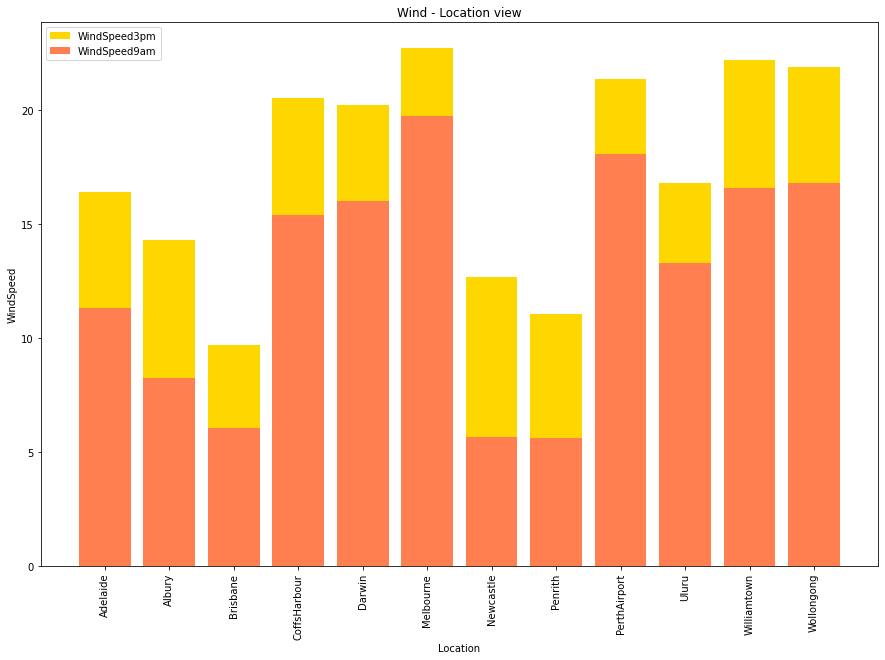

In [58]:
x = wind_loca.loc[:, 'Location']
y1 = wind_loca['WindSpeed9am']
y2 =wind_loca['WindSpeed3pm']

plt.figure(figsize=(15, 10))

plt.bar(x, y2,color='gold', label= 'WindSpeed3pm')
plt.bar(x, y1,  color='coral', label='WindSpeed9am')

plt.xticks(rotation=90)
plt.xlabel('Location')
plt.ylabel('WindSpeed')
plt.title('Wind - Location view')

plt.legend()
plt.show()

__Observation__

- MelbourneAirport recorded the highest WindSpeed at 9am respectively

__RainTomorrow Vs Windspeed__


In [59]:
df.groupby('RainTomorrow')['WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm'].mean() 

,WindGustSpeed,WindSpeed9am,WindSpeed3pm
RainTomorrow,,,
No,37.619993,12.470131,17.343045
Yes,43.460049,13.812530,18.324243


__Observation__

- The likelihood it will rain tomorrow is high if the average of WindGustSpeed, WindSpeed9am and WindSpeed3pm is 43.4600049, 13.81 and 18.32 respectively.


__WindGustSpeed WindSpeed9am and WindSpeed3pm__

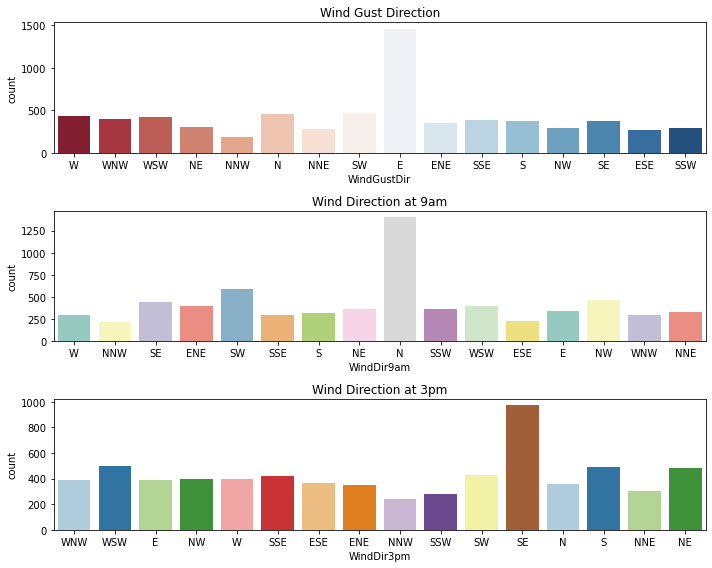

In [60]:
fig, ax = plt.subplots(3, 1, figsize=(10,8))

sns.countplot(df['WindGustDir'], palette= 'RdBu' ,ax=ax[0])
ax[0].set_title('Wind Gust Direction')

sns.countplot(df['WindDir9am'], palette= 'Set3' ,ax=ax[1])
ax[1].set_title('Wind Direction at 9am')


sns.countplot(df['WindDir3pm'], palette= 'Paired' ,ax=ax[2])
ax[2].set_title('Wind Direction at 3pm')

plt.tight_layout()
plt.show()

__RainTomorrow WindGustDir, WindDir9am, WindDir3pm__

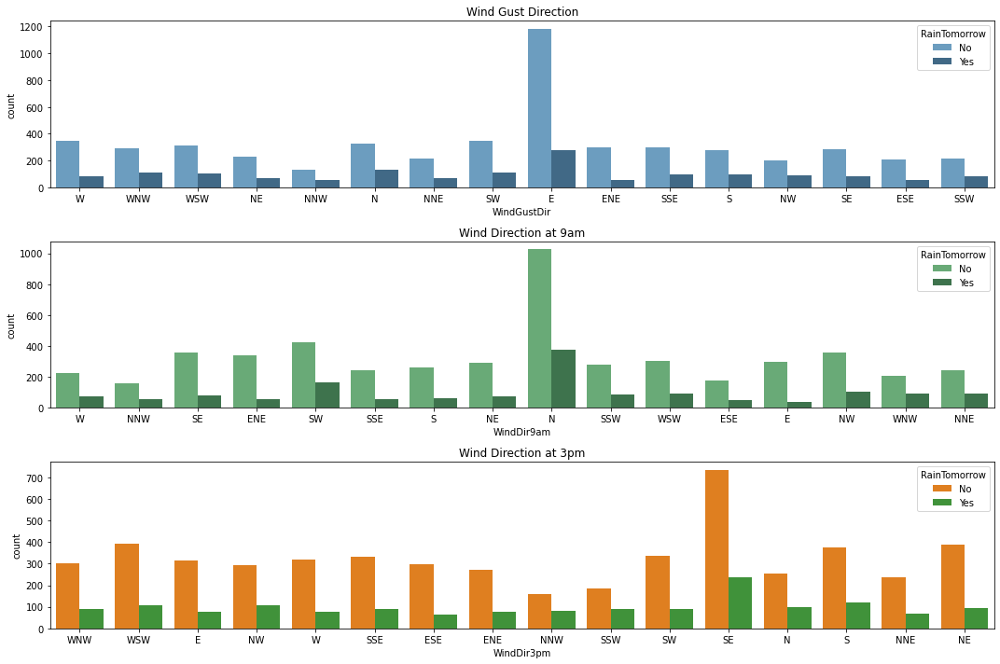

In [61]:
fig, ax = plt.subplots(3, 1, figsize=(15,10))

sns.countplot(df['WindGustDir'], hue=df['RainTomorrow'], palette= 'Blues_d' ,ax=ax[0])
ax[0].set_title('Wind Gust Direction')

sns.countplot(df['WindDir9am'], hue=df['RainTomorrow'], palette= 'Greens_d' ,ax=ax[1])
ax[1].set_title('Wind Direction at 9am')


sns.countplot(df['WindDir3pm'], hue=df['RainTomorrow'], palette= 'Paired_r' ,ax=ax[2])
ax[2].set_title('Wind Direction at 3pm')

plt.tight_layout()
plt.show()

__Obsrevation__
- The probability it will rain tomorrow is high if WindGustDir, WindDir9am, and WindDir3pm are below 3000

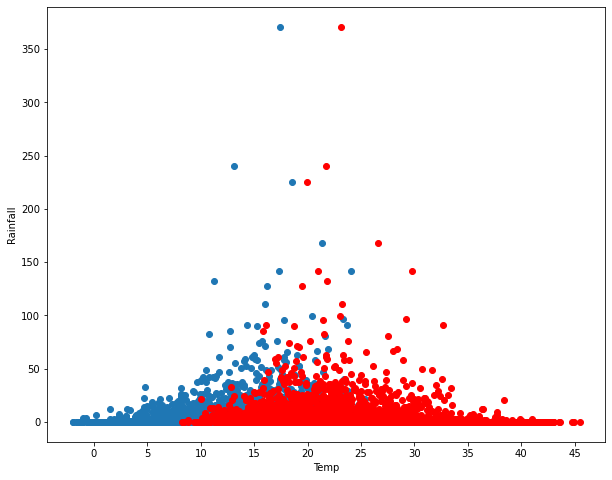

In [62]:
plt.figure(figsize=(10,8))

plt.scatter(df['MinTemp'], df['Rainfall'])
plt.scatter(df['MaxTemp'], df['Rainfall'], color='red')

plt.xlabel('Temp')
plt.ylabel('Rainfall')
plt.xticks(range(0, 50, 5))
plt.show()

__Observation__

- The analysis show that high rainfall occurs when MaxTemp is between 10 and 35 and MinTemp between 10 and 25

<AxesSubplot:xlabel='Day', ylabel='MinTemp'>

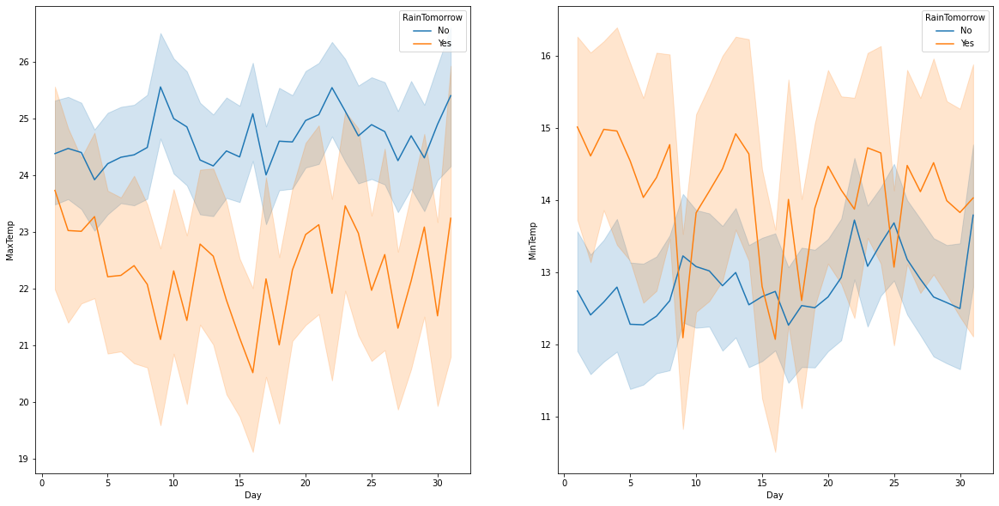

In [63]:
fig, ax = plt.subplots(1,2, figsize=(20,10))

sns.lineplot(x= df['Day'], y=df['MaxTemp'], hue=df['RainTomorrow'], ax=ax[0])

sns.lineplot(x= df['Day'], y=df['MinTemp'], hue=df['RainTomorrow'], ax=ax[1])

__Observation__

- The analysis show that the probability that it will not rain the next day is high when MaxTemp is low.

- On the other hand the analysis show that the probability that it will rain the next day is high when MinTemp is high.

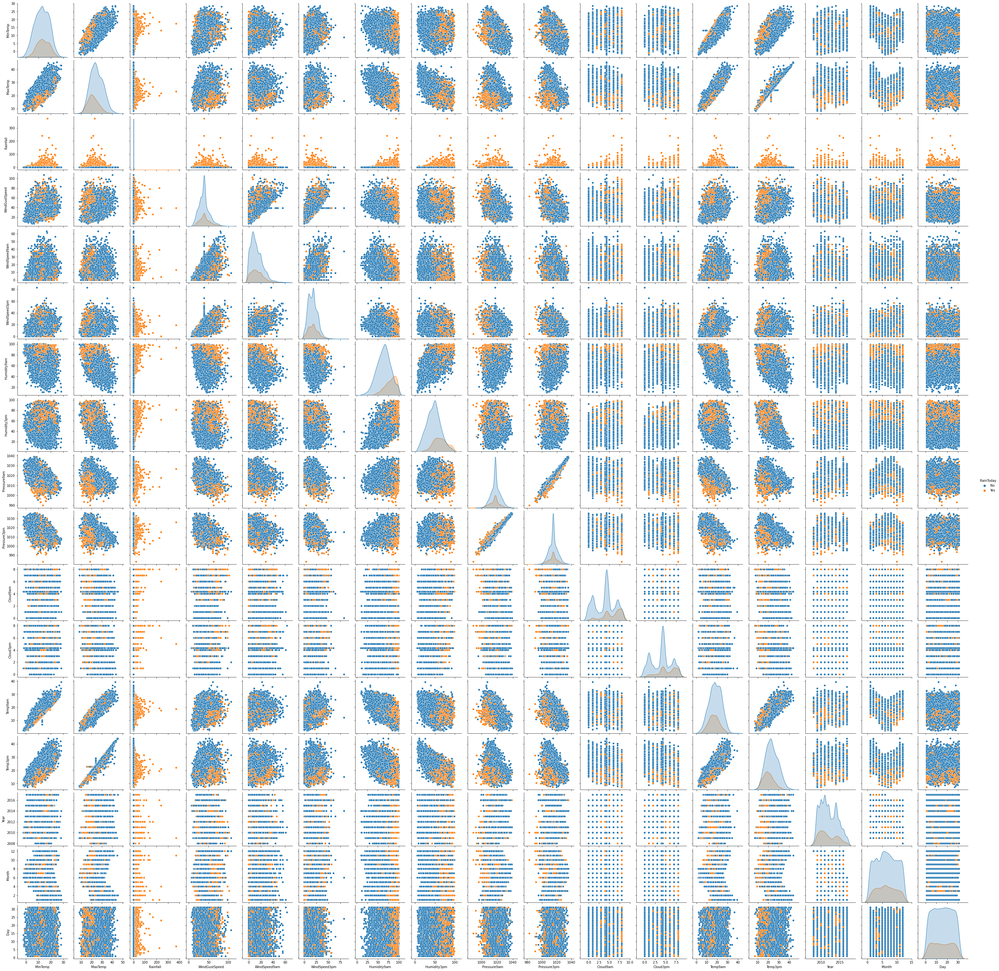

In [62]:
sns.pairplot(df, hue='RainToday', diag_kind='kde')
plt.show()

I have generated the above pairplot for our continous data columns that shows us how the data points are distributed in each of the numeric datatype columns.

### Lets check the skewness of the dataset using .skew() method

In [41]:
df.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.215085
Cloud3pm         -0.162159
Temp9am          -0.047213
Temp3pm           0.348100
Year              0.354481
Month             0.021988
Day               0.006240
dtype: float64

- Rainfall,WindGustSpeed,WindSpeed9am, are skewed lets handle this using zscore method but before handling skewness lets transform our objectdatatype into int/float datatype using transformation technique

In [42]:
from sklearn.preprocessing import LabelEncoder


In [43]:
le=LabelEncoder()


In [44]:
cols=df.select_dtypes(include='object').columns
for i in cols:
    df[i]=le.fit_transform(df[i])
df

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.900000,0.6,13,44.000000,13,14,20.0,24.0,...,1007.1,8.000000,4.320988,16.9,21.8,0,0,2008.0,12.0,1.0
1,1,7.4,25.100000,0.0,14,44.000000,6,15,4.0,22.0,...,1007.8,4.336806,4.320988,17.2,24.3,0,0,2008.0,12.0,2.0
2,1,12.9,25.700000,0.0,15,46.000000,13,15,19.0,26.0,...,1008.7,4.336806,2.000000,21.0,23.2,0,0,2008.0,12.0,3.0
3,1,9.2,28.000000,0.0,4,24.000000,9,0,11.0,9.0,...,1012.8,4.336806,4.320988,18.1,26.5,0,0,2008.0,12.0,4.0
4,1,17.5,32.300000,1.0,13,41.000000,1,7,7.0,20.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008.0,12.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.0,0,31.000000,9,1,13.0,11.0,...,1020.3,4.336806,4.320988,10.1,22.4,0,0,2017.0,6.0,21.0
8421,9,3.6,25.300000,0.0,6,22.000000,9,3,13.0,9.0,...,1019.1,4.336806,4.320988,10.9,24.5,0,0,2017.0,6.0,22.0
8422,9,5.4,26.900000,0.0,3,37.000000,9,14,9.0,9.0,...,1016.8,4.336806,4.320988,12.5,26.1,0,0,2017.0,6.0,23.0
8423,9,7.8,27.000000,0.0,9,28.000000,10,3,13.0,7.0,...,1016.5,3.000000,2.000000,15.1,26.0,0,0,2017.0,6.0,24.0


In [45]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   int32  
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   WindGustDir    6762 non-null   int32  
 5   WindGustSpeed  6762 non-null   float64
 6   WindDir9am     6762 non-null   int32  
 7   WindDir3pm     6762 non-null   int32  
 8   WindSpeed9am   6762 non-null   float64
 9   WindSpeed3pm   6762 non-null   float64
 10  Humidity9am    6762 non-null   float64
 11  Humidity3pm    6762 non-null   float64
 12  Pressure9am    6762 non-null   float64
 13  Pressure3pm    6762 non-null   float64
 14  Cloud9am       6762 non-null   float64
 15  Cloud3pm       6762 non-null   float64
 16  Temp9am        6762 non-null   float64
 17  Temp3pm        6762 non-null   float64
 18  RainToda

__Every column whhich was Object datatype has converted into int datatype__

### Using zscore to remove outliers



In [46]:
from scipy.stats import zscore


In [47]:
z=abs(zscore(df))
z

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.395097,0.052498,1.954990e-01,0.207990,1.220923,3.754887e-01,1.315650,1.372365,0.737499,0.673324,...,1.344002,1.480398,0.000000,0.173897,0.152152,0.550355,0.550355,1.761148,1.639768,1.675969
1,1.395097,1.030484,1.634110e-01,0.265231,1.412005,3.754887e-01,0.222688,1.595253,0.897347,0.463855,...,1.226694,0.000000,0.000000,0.121468,0.266510,0.550355,0.550355,1.761148,1.639768,1.562245
2,1.395097,0.037750,2.612956e-01,0.265231,1.603087,5.250161e-01,1.315650,1.595253,0.635321,0.882794,...,1.075869,0.000000,0.999089,0.542637,0.082299,0.550355,0.550355,1.761148,1.639768,1.448521
3,1.395097,0.705589,6.365197e-01,0.265231,0.498814,1.119786e+00,0.436600,1.748064,0.182102,0.897697,...,0.388779,0.000000,0.000000,0.035820,0.634933,0.550355,0.550355,1.761148,1.639768,1.334798
4,1.395097,0.792536,1.338026e+00,0.169829,1.220923,1.511975e-01,1.321500,0.187849,0.590814,0.254385,...,1.528343,1.076270,1.583662,0.016609,1.170820,0.550355,0.550355,1.761148,1.639768,1.221074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.186193,1.860770,1.139286e-01,0.265231,1.263141,5.964399e-01,0.436600,1.525176,0.022254,0.688228,...,0.868092,0.000000,0.000000,1.362295,0.051673,0.550355,0.550355,2.150387,0.136841,0.598504
8421,1.186193,1.716373,1.960392e-01,0.265231,0.116650,1.269314e+00,0.436600,1.079401,0.022254,0.897697,...,0.666993,0.000000,0.000000,1.222484,0.300003,0.550355,0.550355,2.150387,0.136841,0.712227
8422,1.186193,1.391478,4.570647e-01,0.265231,0.689895,1.478575e-01,0.436600,1.372365,0.386458,0.897697,...,0.281552,0.000000,0.000000,0.942861,0.567947,0.550355,0.550355,2.150387,0.136841,0.825951
8423,1.186193,0.958285,4.733788e-01,0.265231,0.456596,8.207311e-01,0.656363,1.079401,0.022254,1.107167,...,0.231277,0.540240,0.999089,0.488473,0.551200,0.550355,0.550355,2.150387,0.136841,0.939675


In [48]:
df_new=df[(z<3).all(axis=1)]
df_new

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.900000,0.6,13,44.000000,13,14,20.0,24.0,...,1007.1,8.000000,4.320988,16.9,21.8,0,0,2008.0,12.0,1.0
1,1,7.4,25.100000,0.0,14,44.000000,6,15,4.0,22.0,...,1007.8,4.336806,4.320988,17.2,24.3,0,0,2008.0,12.0,2.0
2,1,12.9,25.700000,0.0,15,46.000000,13,15,19.0,26.0,...,1008.7,4.336806,2.000000,21.0,23.2,0,0,2008.0,12.0,3.0
3,1,9.2,28.000000,0.0,4,24.000000,9,0,11.0,9.0,...,1012.8,4.336806,4.320988,18.1,26.5,0,0,2008.0,12.0,4.0
4,1,17.5,32.300000,1.0,13,41.000000,1,7,7.0,20.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008.0,12.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.0,0,31.000000,9,1,13.0,11.0,...,1020.3,4.336806,4.320988,10.1,22.4,0,0,2017.0,6.0,21.0
8421,9,3.6,25.300000,0.0,6,22.000000,9,3,13.0,9.0,...,1019.1,4.336806,4.320988,10.9,24.5,0,0,2017.0,6.0,22.0
8422,9,5.4,26.900000,0.0,3,37.000000,9,14,9.0,9.0,...,1016.8,4.336806,4.320988,12.5,26.1,0,0,2017.0,6.0,23.0
8423,9,7.8,27.000000,0.0,9,28.000000,10,3,13.0,7.0,...,1016.5,3.000000,2.000000,15.1,26.0,0,0,2017.0,6.0,24.0


In [51]:
print("Shape before Outlier Removal",df.shape)
print("Shape After Outlier Removal",df_new.shape)

Shape before Outlier Removal (6762, 23)
Shape After Outlier Removal (6460, 23)


In [49]:
dataloss=1-(6460/6762)
print("Dataloss:",dataloss)

Dataloss: 0.04466134279798872


__4% of data is lost checking for skewness again__

In [50]:
df_new.skew()

Location        -0.001075
MinTemp         -0.083371
MaxTemp          0.263487
Rainfall         3.515053
WindGustDir      0.101237
WindGustSpeed    0.478698
WindDir9am       0.209958
WindDir3pm      -0.128440
WindSpeed9am     0.679941
WindSpeed3pm     0.340302
Humidity9am     -0.229874
Humidity3pm      0.160495
Pressure9am      0.059377
Pressure3pm      0.087611
Cloud9am        -0.204151
Cloud3pm        -0.146475
Temp9am         -0.075472
Temp3pm          0.286783
RainToday        1.337215
RainTomorrow     1.331836
Year             0.341624
Month            0.029216
Day              0.004460
dtype: float64

__Using Log Transform to fix skewness in continous columns__

Skewness before np.log method 3.51505290032758

Minimum value of Ranfall column 0.0


<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

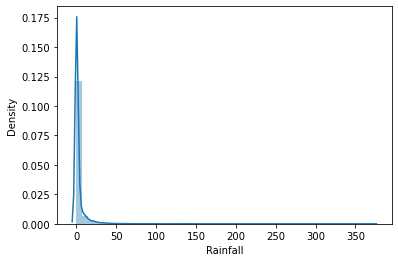

In [51]:
print("Skewness before np.log method",df_new['Rainfall'].skew())
print("\nMinimum value of Ranfall column",df_new['Rainfall'].min())
sns.distplot(df['Rainfall'])

In [52]:
## It has min value of 0, so we need t add 1 as a constant so that np.log method can work on it
df_new['Rainfall']=np.log(df_new['Rainfall']+1)


In [53]:
print("Skewness after np.log method",df_new['Rainfall'].skew())

Skewness after np.log method 1.7362871413524776


Skewness reduced from 3.51 to 1.73

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

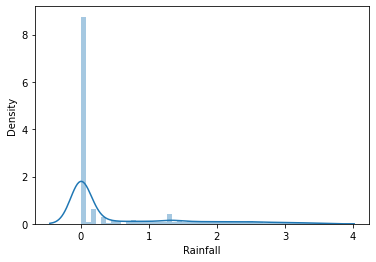

In [54]:
sns.distplot(df_new['Rainfall'])

<AxesSubplot:xlabel='Rainfall'>

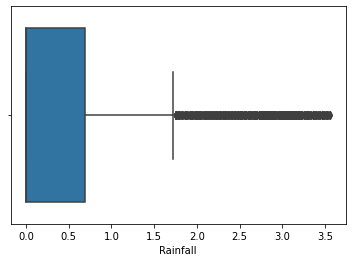

In [55]:
sns.boxplot(df_new['Rainfall'])

Skewness before np.log method 0.6799407178533564

Minimum value of Ranfall column 0.0


<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

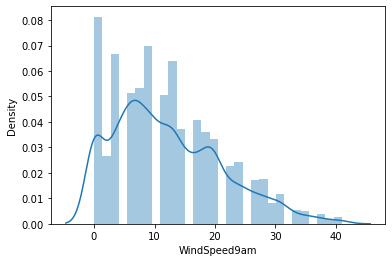

In [56]:
print("Skewness before np.log method",df_new['WindSpeed9am'].skew())
print("\nMinimum value of Ranfall column",df_new['WindSpeed9am'].min())
sns.distplot(df_new['WindSpeed9am'])

In [58]:
df_new['WindSpeed9am']=np.log(df_new['WindSpeed9am']+1)

In [59]:
print("\nSkewness after np.log method",df_new['WindSpeed9am'].skew())


Skewness after np.log method -1.0639211240802962


Skewness rduced from 0.67 to -1.06

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

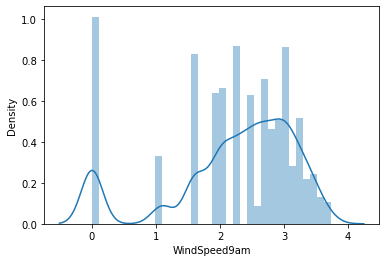

In [60]:
sns.distplot(df_new['WindSpeed9am'])

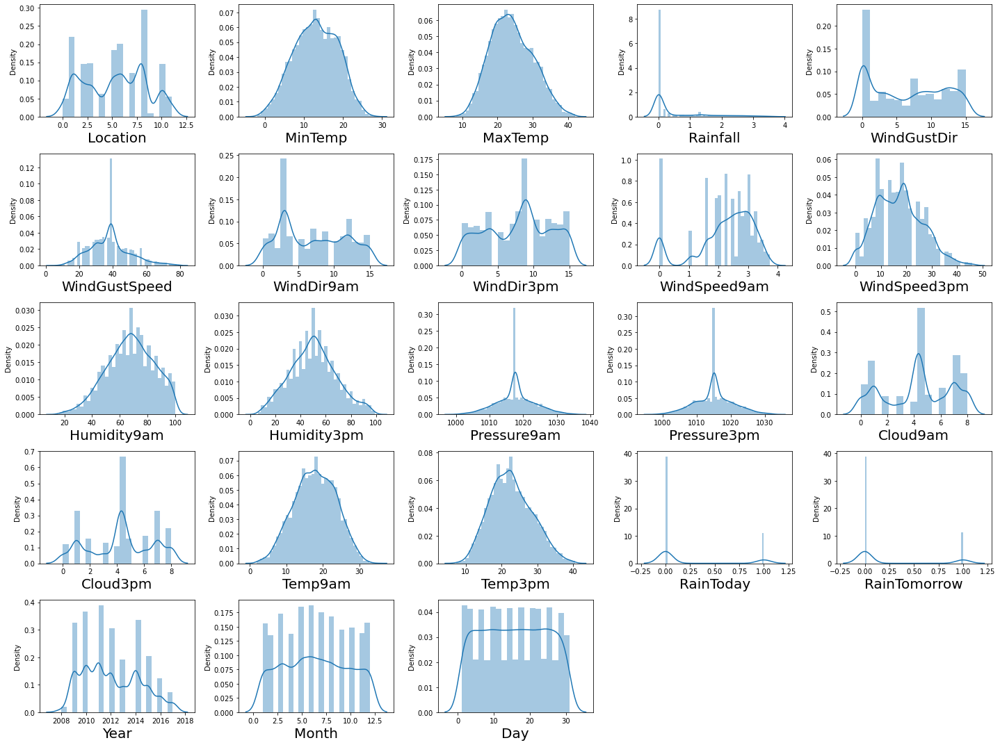

In [61]:
## Visulaising the data now
plt.figure(figsize=(20,15),facecolor='white')
plot_number=1

for column in df_new:
    if plot_number<=25: 
        ax=plt.subplot(5,5,plot_number)
        sns.distplot(df_new[column]) 
        plt.xlabel(column,fontsize=20)
        
        
    plot_number +=1
    
    
plt.tight_layout() 

### Correlation using a Heatmap

<AxesSubplot:>

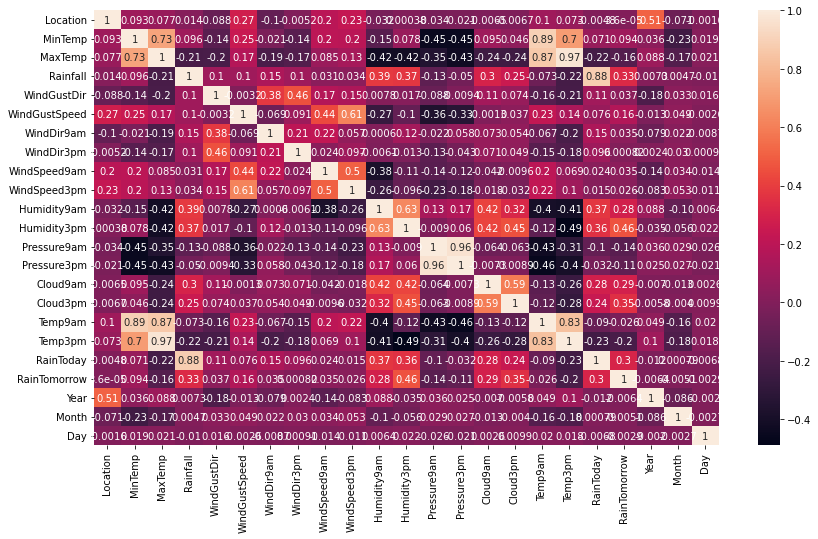

In [62]:
plt.figure(figsize=(14,8))
sns.heatmap(df_new.corr(),annot=True)

Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.
Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down

__Observation__
- Temp3pm and MinTemp are highly correlated (corr coefficient = 0.70)

- Temp3pm and Temp9am are highly correlated (corr coefficient = 0.83)

- Temp9am and MaxTemp are highly correlated (corr coefficient = 0.87)

- Temp9am and MinTemp are highly correlated (corr coefficient = 0.89)

- Pressure3pm and Pressure9am are highly correlated (corr coefficient = 0.96)

- MaxTemp and MinTemp are highly correlated (corr coefficient = 0.73)

__Checking by Scatter plot to confirm Multicolinearity__

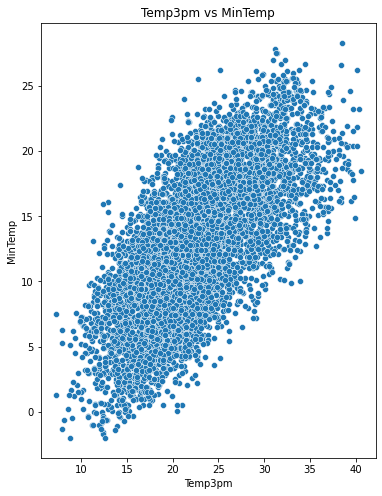

In [86]:
# Visualising the relationship between correlated features
plt.figure(figsize=(6,8))
plt.title('Temp3pm vs MinTemp')
sns.scatterplot(x='Temp3pm',y='MinTemp',data=df_new)
plt.show()

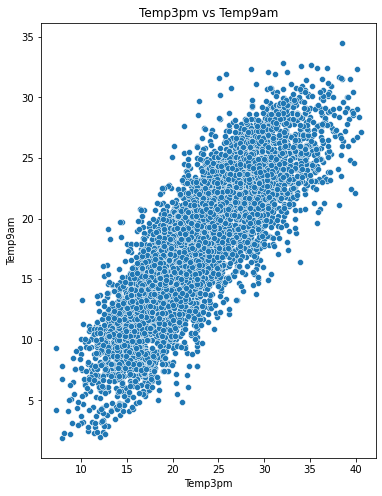

In [87]:
plt.figure(figsize=(6,8))
plt.title('Temp3pm vs Temp9am')
sns.scatterplot(x='Temp3pm',y='Temp9am',data=df_new)
plt.show()

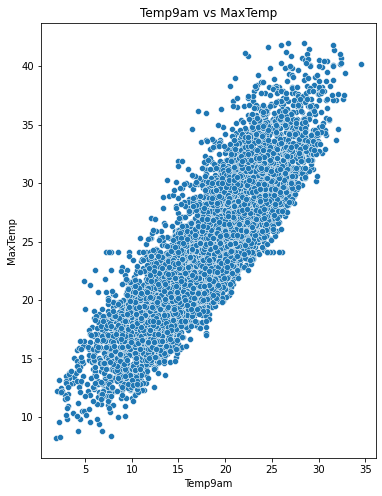

In [88]:
plt.figure(figsize=(6,8))
plt.title('Temp9am vs MaxTemp')
sns.scatterplot(x='Temp9am',y='MaxTemp',data=df_new)
plt.show()

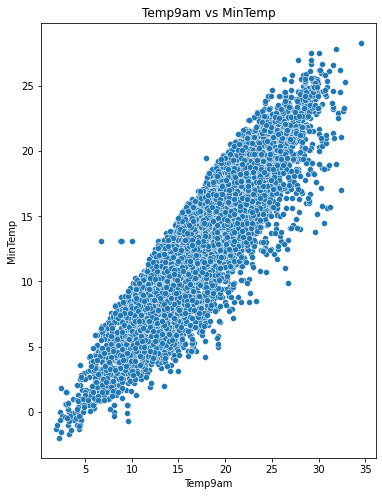

In [89]:
plt.figure(figsize=(6,8))
plt.title('Temp9am vs MinTemp')
sns.scatterplot(x='Temp9am',y='MinTemp',data=df_new)
plt.show()

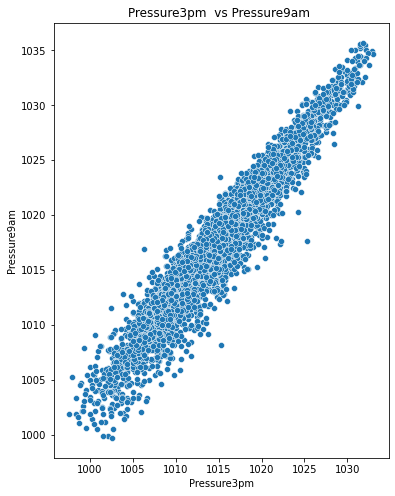

In [90]:
plt.figure(figsize=(6,8))
plt.title('Pressure3pm  vs Pressure9am ')
sns.scatterplot(x='Pressure3pm',y='Pressure9am',data=df_new)
plt.show()

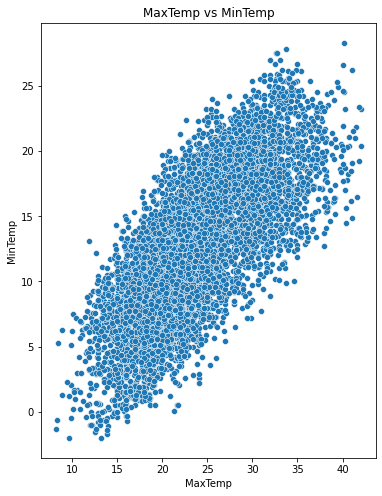

In [91]:
plt.figure(figsize=(6,8))
plt.title('MaxTemp vs MinTemp')
sns.scatterplot(x='MaxTemp',y='MinTemp',data=df_new)
plt.show()

Every scatetrplot is showing positive correaltion betwen features 
## Splitting the dataset into 2 variables namely 'x' and 'y' for feature and label

### Task 1-Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.(Classification)

In [63]:
#when Raintomorrow is label
x=df_new.drop('RainTomorrow',axis=1)
y=df_new['RainTomorrow']

### Using SelectKBest feature selection technique

In [64]:
from sklearn.feature_selection import SelectKBest, f_classif


In [65]:
selector = SelectKBest(score_func=f_classif, k=14)
fit=selector.fit(x, y)
df_scores=pd.DataFrame(fit.scores_)
df_columns=pd.DataFrame(x.columns)


In [66]:
#concatenate df
feature_scores=pd.concat([df_columns,df_scores],axis=1)

In [67]:
feature_scores.columns=['Feature Name','Score']

In [68]:
print(feature_scores.nlargest(14,'Score'))

     Feature Name        Score
11    Humidity3pm  1769.586384
15       Cloud3pm   911.622453
3        Rainfall   784.652745
18      RainToday   659.161486
14       Cloud9am   581.705093
10    Humidity9am   564.819642
17        Temp3pm   273.785178
5   WindGustSpeed   179.431745
2         MaxTemp   166.118988
12    Pressure9am   130.213609
13    Pressure3pm    84.180929
1         MinTemp    57.330585
4     WindGustDir     8.654815
8    WindSpeed9am     7.841848


__we got our best 14 features so we consider these our features and predict label__

In [98]:
new_x=df_new[['Humidity3pm','Cloud3pm','Rainfall','RainToday','Cloud9am',
             'Humidity9am','Temp3pm','WindGustSpeed','MaxTemp',
            'Pressure9am','Pressure3pm','MinTemp','WindGustDir','WindSpeed9am' ]]


## Scaling the features

In [99]:
scaler=StandardScaler()
X=scaler.fit_transform(new_x)
X

array([[-1.55817949,  0.01758994, -0.02415015, ...,  0.06528258,
         1.22046872,  0.82374849],
       [-1.39328861,  0.01758994, -0.56323513, ..., -1.01755148,
         1.41134702, -0.63687324],
       [-1.11847048, -0.98389283, -0.56323513, ..., -0.02495359,
         1.60222531,  0.7740901 ],
       ...,
       [-1.44825224,  0.01758994, -0.56323513, ..., -1.37849617,
        -0.68831422,  0.06860843],
       [-1.44825224, -0.98389283, -0.56323513, ..., -0.94536254,
         0.45695555,  0.41106816],
       [-0.78868872,  1.60504666, -0.56323513, ...,  0.3359911 ,
        -1.2609491 ,  0.66685471]])

### Resolving the class imbalance issue in our label column

In [100]:
y.value_counts()


0    5020
1    1440
Name: RainTomorrow, dtype: int64

In [101]:
from imblearn.over_sampling import SMOTE


In [102]:
# adding samples to make all the categorical label values same

oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [103]:
y.value_counts()


0    5020
1    5020
Name: RainTomorrow, dtype: int64

In [86]:
from sklearn.linear_model import LogisticRegression

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score,GridSearchCV 


### For best Random State

In [106]:
lr=LogisticRegression()
maxAcc=0
rs=0
for i in range(1000):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=i)
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    ac=accuracy_score(y_test,pred)
    if ac>maxAcc:
        maxAcc=ac
        rs=i
print('Best score:',maxAcc)
print('Random State:',rs)

Best score: 0.801195219123506
Random State: 868


In [107]:
#Let us split the data now at that random state
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=868)

In [118]:
print("Size of x_train :",x_train.shape)
print("Size of x_test :",x_test.shape)
print("Size of x_train :",y_train.shape)
print("Size of x_train :",y_test.shape)

Size of x_train : (7530, 14)
Size of x_test : (2510, 14)
Size of x_train : (7530,)
Size of x_train : (2510,)


## Machine Learning Model for Classification with Evaluation Metrics

In [123]:
def classify(clf, X,y):
    x_train, x_test, y_train, y_test = train_test_split(X,y, test_size=0.25, random_state=868)
    
    # Training the model
    clf.fit(x_train,y_train)
    
    # Predicting Y_test
    pred = clf.predict(x_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(y_test, pred))
    print("Accuracy Score:", acc_score)
    
     #confusion matrix:
    print('confusion matrix:\n',confusion_matrix(y_test,pred))
    
    # Classification Report
    class_report = classification_report(y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    
    
    # Cross Validation Score
    cv_score = (cross_val_score(clf, X, y, cv=5).mean())
    print("Cross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

### Logistic Regression


In [124]:
clf=LogisticRegression()
classify(clf,X,y)

Accuracy Score: 0.801195219123506
confusion matrix:
 [[ 992  250]
 [ 249 1019]]

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.80      0.80      1242
           1       0.80      0.80      0.80      1268

    accuracy                           0.80      2510
   macro avg       0.80      0.80      0.80      2510
weighted avg       0.80      0.80      0.80      2510

Cross Validation Score: 0.7493027888446215

Accuracy Score - Cross Validation Score is 0.05189243027888446


### Decision Tree

In [125]:
clf=DecisionTreeClassifier()
classify(clf, X, y)

Accuracy Score: 0.8338645418326693
confusion matrix:
 [[1018  224]
 [ 193 1075]]

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83      1242
           1       0.83      0.85      0.84      1268

    accuracy                           0.83      2510
   macro avg       0.83      0.83      0.83      2510
weighted avg       0.83      0.83      0.83      2510

Cross Validation Score: 0.7460159362549801

Accuracy Score - Cross Validation Score is 0.08784860557768925


### RandomForest

In [127]:
clf=RandomForestClassifier()
classify(clf, X, y)

Accuracy Score: 0.8904382470119522
confusion matrix:
 [[1081  161]
 [ 114 1154]]

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.87      0.89      1242
           1       0.88      0.91      0.89      1268

    accuracy                           0.89      2510
   macro avg       0.89      0.89      0.89      2510
weighted avg       0.89      0.89      0.89      2510

Cross Validation Score: 0.8150398406374503

Accuracy Score - Cross Validation Score is 0.0753984063745019


### SVC

In [128]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [129]:
clf= SVC()
classify(clf, X, y)

Accuracy Score: 0.8278884462151395
confusion matrix:
 [[ 992  250]
 [ 182 1086]]

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.80      0.82      1242
           1       0.81      0.86      0.83      1268

    accuracy                           0.83      2510
   macro avg       0.83      0.83      0.83      2510
weighted avg       0.83      0.83      0.83      2510

Cross Validation Score: 0.7581673306772908

Accuracy Score - Cross Validation Score is 0.06972111553784865


### KNeighborsClassifier

In [130]:
clf=KNeighborsClassifier()
classify(clf,X, y)

Accuracy Score: 0.8438247011952191
confusion matrix:
 [[ 917  325]
 [  67 1201]]

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.74      0.82      1242
           1       0.79      0.95      0.86      1268

    accuracy                           0.84      2510
   macro avg       0.86      0.84      0.84      2510
weighted avg       0.86      0.84      0.84      2510

Cross Validation Score: 0.774402390438247

Accuracy Score - Cross Validation Score is 0.06942231075697214


### XGB

In [131]:
import xgboost as xgb

In [132]:
clf=xgb.XGBClassifier()

classify(clf, X,y)


Accuracy Score: 0.9035856573705179
confusion matrix:
 [[1141  101]
 [ 141 1127]]

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      1242
           1       0.92      0.89      0.90      1268

    accuracy                           0.90      2510
   macro avg       0.90      0.90      0.90      2510
weighted avg       0.90      0.90      0.90      2510

Cross Validation Score: 0.7843625498007968

Accuracy Score - Cross Validation Score is 0.1192231075697211


###  We can see the least difference b/w cv score and f1 score is for LogisticRegressor.Choosing LogisticRegression as our final model

In [119]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
predn=lr.predict(x_test)
print("Accuracy Score:",accuracy_score(y_test,predn))
print("Confusion Matrix\n",confusion_matrix(y_test,predn))
print("Classification Report:",classification_report(y_test,predn))

Accuracy Score: 0.801195219123506
Confusion Matrix
 [[ 992  250]
 [ 249 1019]]
Classification Report:               precision    recall  f1-score   support

           0       0.80      0.80      0.80      1242
           1       0.80      0.80      0.80      1268

    accuracy                           0.80      2510
   macro avg       0.80      0.80      0.80      2510
weighted avg       0.80      0.80      0.80      2510



## Hyper parameter tuning on the best Classification ML Model


In [120]:
from sklearn.model_selection import GridSearchCV


In [141]:
param = {'penalty': ['l1', 'l2'],
         'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000] ,
         'solver': ['liblinear', 'saga'] 
}
             

In [142]:
grid = GridSearchCV(LogisticRegression(), param, verbose = 1, cv=5, n_jobs = -1)
grid.fit(x_train,y_train)
print('score: ',grid.best_score_)
print('best estimators:',grid.best_estimator_)
print('best parameters:',grid.best_params_)


Fitting 5 folds for each of 32 candidates, totalling 160 fits
score:  0.7677290836653388
best estimators: LogisticRegression(C=1, penalty='l1', solver='liblinear')
best parameters: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}


In [172]:
lr_final=LogisticRegression(C=100,penalty='l1',solver='liblinear')
lr_final.fit(x_train,y_train)
predlr=lr_final.predict(x_test)
print("Accuracy Score:",accuracy_score(y_test,predlr))
print("Confusion Matrix\n",confusion_matrix(y_test,predlr))
print("Classification Report:\n",classification_report(y_test,predlr))


Accuracy Score: 0.801195219123506
Confusion Matrix
 [[ 991  251]
 [ 248 1020]]
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.80      0.80      1242
           1       0.80      0.80      0.80      1268

    accuracy                           0.80      2510
   macro avg       0.80      0.80      0.80      2510
weighted avg       0.80      0.80      0.80      2510



### As accuracy is not incrasing , even after hypertunning the parameters, lets try next best Algo based on f1 score and least difference between accuracy and CV_score i.e KNeighborsClassifier

### KNeighborsClassifier Without Hypertuning Parameters

In [174]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
print("Accuracy Score:",accuracy_score(y_test,predknn))
print("Confusion Matrix\n",confusion_matrix(y_test,predknn))
print("Classification Report:",classification_report(y_test,predknn))

Accuracy Score: 0.8438247011952191
Confusion Matrix
 [[ 917  325]
 [  67 1201]]
Classification Report:               precision    recall  f1-score   support

           0       0.93      0.74      0.82      1242
           1       0.79      0.95      0.86      1268

    accuracy                           0.84      2510
   macro avg       0.86      0.84      0.84      2510
weighted avg       0.86      0.84      0.84      2510



### Hyper parameter tuning on the 2nd best Classification ML Model (KNeighborsClassifiers)


In [175]:
grid_params = { 'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

In [176]:
grid = GridSearchCV(KNeighborsClassifier(), grid_params, verbose = 1, cv=5, n_jobs = -1)


In [177]:
grid.fit(x_train,y_train)

print('score: ',grid.best_score_)
print('\nbest estimators:',grid.best_estimator_)
print('\nbest parameters:',grid.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
score:  0.8551128818061089

best estimators: KNeighborsClassifier(metric='manhattan', weights='distance')

best parameters: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}


In [182]:
knn_final=KNeighborsClassifier(metric='manhattan', n_neighbors=5, weights='distance')
knn_final.fit(x_train,y_train)
pred_knn=knn_final.predict(x_test)
print("Accuracy Score:",accuracy_score(y_test,pred_knn))
print("Confusion Matrix\n",confusion_matrix(y_test,pred_knn))
print("Classification Report:\n",classification_report(y_test,pred_knn))

Accuracy Score: 0.8681274900398407
Confusion Matrix
 [[ 953  289]
 [  42 1226]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.77      0.85      1242
           1       0.81      0.97      0.88      1268

    accuracy                           0.87      2510
   macro avg       0.88      0.87      0.87      2510
weighted avg       0.88      0.87      0.87      2510



__Fianlly Accuracy got increased from 0.8438 to 0.8681 , Saving the model__<br>
## AUC ROC Curve


In [183]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn import metrics

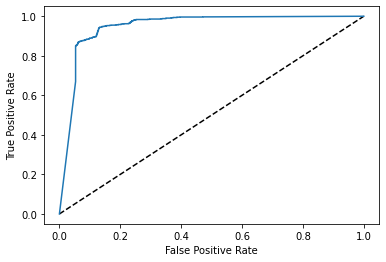

Score: 0.8670938803293761


In [184]:
from sklearn.metrics import roc_auc_score
#Predicting the probability of having 1 in the x-test
y_pred_prob=knn_final.predict_proba(x_test)[:,1]

fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='KNeighborsClassifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()
auc_score=roc_auc_score(y_test,knn_final.predict(x_test))
print('Score:',auc_score)

## Confusion Matrix

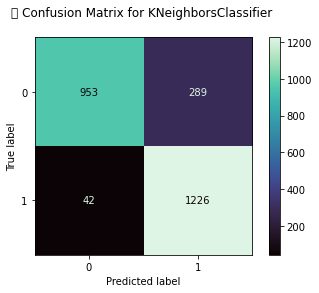

In [185]:
class_names = df_new.columns
metrics.plot_confusion_matrix(knn_final.fit(x_train,y_train), x_test, y_test, cmap='mako')
plt.title('\t Confusion Matrix for KNeighborsClassifier \n')
plt.show()

- With the help of above confusion matrix I am able to understand the number of times I got the correct outputs and the number of times my ML model missed to provide the correct prediction (depicting in the black boxes)

### Saving the model

In [186]:
import pickle


In [187]:
filename='Rain prediction-classification.pkl'

In [188]:
pickle.dump(knn_final,open(filename,'wb'))


In [190]:
#conclusion
loaded_model=pickle.load(open('Rain prediction-classification.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

86.81274900398407


In [191]:
#Conslusion
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],pred[:]],index=['Predcited','Orignal'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,2500,2501,2502,2503,2504,2505,2506,2507,2508,2509
Predcited,0,0,0,1,0,0,1,0,1,1,...,1,1,1,0,1,1,1,1,1,0
Orignal,0,1,1,1,1,1,1,1,1,1,...,0,0,1,0,0,1,0,1,0,0


## Task 2- To predict how much rainfall could be there(Regression Problem)

- Here Rainfall is our Label column <br>

## Splitting the dataset into 2 variables namely 'xr' and 'yr' for feature and label


In [69]:
df_new.shape

(6460, 23)

In [70]:
xr=df_new.drop('Rainfall',axis=1)
yr=df_new['Rainfall']

I have separated the dataset into features and regression label where X represents all the feature columns and Y represents the regression target label column.

__Using SelectKBest feature selection technique__

In [71]:
selector1 = SelectKBest(score_func=f_classif, k=14)
fit1=selector1.fit(xr, yr)
df1_scores=pd.DataFrame(fit1.scores_)
df1_columns=pd.DataFrame(xr.columns)


In [72]:
#concatenate df
feature_scores1=pd.concat([df1_columns,df1_scores],axis=1)

In [73]:
feature_scores1.columns=['Feature Name','Score']

In [74]:
print(feature_scores1.nlargest(14,'Score'))

     Feature Name     Score
17      RainToday       inf
9     Humidity9am  9.919966
10    Humidity3pm  8.914096
18   RainTomorrow  6.803770
13       Cloud9am  5.415870
14       Cloud3pm  4.360739
16        Temp3pm  3.992197
2         MaxTemp  3.752241
5      WindDir9am  1.977193
11    Pressure9am  1.910517
3     WindGustDir  1.904546
8    WindSpeed3pm  1.800688
4   WindGustSpeed  1.725100
15        Temp9am  1.715512


In [76]:
new_x1=df_new[['RainToday','Humidity9am','Humidity3pm','RainTomorrow','Cloud9am','Cloud3pm','Temp3pm',
          'MaxTemp','WindDir9am','Pressure9am',
          'WindGustDir','WindSpeed3pm','WindGustSpeed','Temp9am']]

In [77]:
new_x1.shape

(6460, 14)

In [78]:
yr.shape

(6460,)

## Scaling the features

In [79]:
scaler=StandardScaler()
Xr=scaler.fit_transform(new_x1)
Xr.shape

(6460, 14)

In [80]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

### Finding the best random state for building Regression Models

In [81]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    X_train, X_test, Y_train, Y_test = train_test_split(Xr, yr, test_size=0.25, random_state=i)
    lr=LinearRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(Y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best R2 score is", maxAccu,"on Random State", maxRS)

Best R2 score is 0.8124446378260217 on Random State 980


In [79]:
#Let us split the data now at that random state
X_train,X_test,Y_train,Y_test=train_test_split(Xr,yr,test_size=0.25,random_state=980)


In [82]:
print("Size of x_train :",X_train.shape)
print("Size of x_test :",X_test.shape)
print("Size of x_train :",Y_train.shape)
print("Size of x_train :",Y_test.shape)

Size of x_train : (4845, 14)
Size of x_test : (1615, 14)
Size of x_train : (4845,)
Size of x_train : (1615,)


## SIngle functin for different Regression Model

In [91]:
def reg(model, Xr, yr):
    X_train, X_test, Y_train, Y_test = train_test_split(Xr, yr, test_size=0.25, random_state=135)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # MSE - a lower RMSE score is better than a higher one
    mse = mean_squared_error(Y_test, pred)
    print("MSE Score is:", mse)
    
    #RMSE
    print("RMSE Score is:", np.sqrt(mse))
    
    # R2 score
    r2 = r2_score(Y_test, pred)*100
    print("R2 Score is:", r2)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, Xr, yr, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of r2 score minus cv score
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)

In [92]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

##  Linear Regression Model

In [93]:
model=LinearRegression()
reg(model, Xr, yr)

MSE Score is: 0.1614872862809732
RMSE Score is: 0.4018548074628114
R2 Score is: 78.88076727023763
Cross Validation Score: 78.37493944835117
R2 Score - Cross Validation Score is 0.5058278218864558


##  Ridge Regression


In [94]:

model=Ridge()
reg(model, Xr, yr)

MSE Score is: 0.1614815343345154
RMSE Score is: 0.4018476506519795
R2 Score is: 78.8815195071393
Cross Validation Score: 78.3750399777037
R2 Score - Cross Validation Score is 0.5064795294356088


##  Lasso Regression

In [95]:
model=Lasso()
reg(model, Xr, yr)

MSE Score is: 0.7647378141786141
RMSE Score is: 0.8744928897244472
R2 Score is: -0.012058204924025873
Cross Validation Score: -0.5976241043190811
R2 Score - Cross Validation Score is 0.5855658993950552


## Support Vector Regression

In [96]:
model=SVR()
reg(model, Xr, yr)

MSE Score is: 0.16711417454866004
RMSE Score is: 0.4087960060331559
R2 Score is: 78.1448854209205
Cross Validation Score: 77.01708568323404
R2 Score - Cross Validation Score is 1.127799737686459


## Decision Tree Regressor


In [97]:
model=DecisionTreeRegressor()

reg(model, Xr, yr)

MSE Score is: 0.354713132166602
RMSE Score is: 0.5955779815998926
R2 Score is: 53.61078037130862
Cross Validation Score: 53.71994608957309
R2 Score - Cross Validation Score is -0.10916571826447097


## Random Forest Regressor


In [98]:
model=RandomForestRegressor()
reg(model, Xr, yr)

MSE Score is: 0.16398980298143728
RMSE Score is: 0.4049565445593358
R2 Score is: 78.5534892917393
Cross Validation Score: 77.7703053603034
R2 Score - Cross Validation Score is 0.7831839314359001


## K Neighbors Regressor


In [99]:
model=KNeighborsRegressor()
reg(model, Xr, yr)

MSE Score is: 0.18637291519853683
RMSE Score is: 0.43170929477894826
R2 Score is: 75.62623621184773
Cross Validation Score: 74.40115060356864
R2 Score - Cross Validation Score is 1.2250856082790875


## Gradient Boosting Regressor


In [100]:
model=GradientBoostingRegressor()
reg(model, Xr, yr)

MSE Score is: 0.15850027128831187
RMSE Score is: 0.3981209254589764
R2 Score is: 79.2714077116625
Cross Validation Score: 79.01630127571894
R2 Score - Cross Validation Score is 0.25510643594356


## Ada Boost Regressor


In [101]:
model=AdaBoostRegressor()
reg(model, Xr, yr)

MSE Score is: 0.19133938256297142
RMSE Score is: 0.4374235733965094
R2 Score is: 74.97672390329502
Cross Validation Score: 75.56946669818494
R2 Score - Cross Validation Score is -0.5927427948899151


### On the basis of r2 score and difference between r2 score and CV score Gradient Boosting Regressor is performing better , so selecting this model__<br>

### Gradient Boosting Regressor without Hypertuning 

In [137]:
gdbr=GradientBoostingRegressor()
gdbr.fit(X_train,Y_train)
predn=gdbr.predict(X_test)
mse = mean_squared_error(Y_test, predn)

print("MSE Score is:", mse)
print("RMSE Score is:", np.sqrt(mse))

r2 = r2_score(Y_test, predn)
print("R2 Score is:", r2)


MSE Score is: 0.1319114396728253
RMSE Score is: 0.36319614490358415
R2 Score is: 0.8142048528683381


## Hyper parameter tuning on the best Regression ML Model


In [104]:
parameter={'loss':['squared_error', 'absolute_error', 'huber', 'quantile']
           ,'learning_rate':np.arange(0.01,1.0,.01),
         'criterion':['friedman_mse','squared_error']}

In [105]:
grid=GridSearchCV(gdbr,param_grid=parameter)
grid.fit(X_train,Y_train)


GridSearchCV(estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]),
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile']})

In [106]:
print("Best score:",grid.best_score_)
print("Best estimator:",grid.best_estimator_)
print("Best parameters:",grid.best_params_)

Best score: 0.7910014200636079
Best estimator: GradientBoostingRegressor(learning_rate=0.09)
Best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.09, 'loss': 'squared_error'}


In [136]:
gbr_final=GradientBoostingRegressor(learning_rate=0.09,criterion='friedman_mse',loss='squared_error',)
gbr_final.fit(X_train,Y_train)
pred_gbr=gbr_final.predict(X_test)
mse = mean_squared_error(Y_test, pred_gbr)

print("MSE Score is:", mse)
print("RMSE Score is:", np.sqrt(mse))

r2 = r2_score(Y_test, pred_gbr)
print("R2 Score is:", r2)


MSE Score is: 0.1301975838486546
RMSE Score is: 0.3608290230131919
R2 Score is: 0.8166187913091894


### We tried Hypertunning for the Gradientboosting  when features were selected using SelectKBest technique but here even after hypertuning we got very less increment in our accuracy so lets try to select the feature manually then build the model and check accuaracy__

## Again Plotting heatmap and checking correlation when Rainfall is label column

<AxesSubplot:>

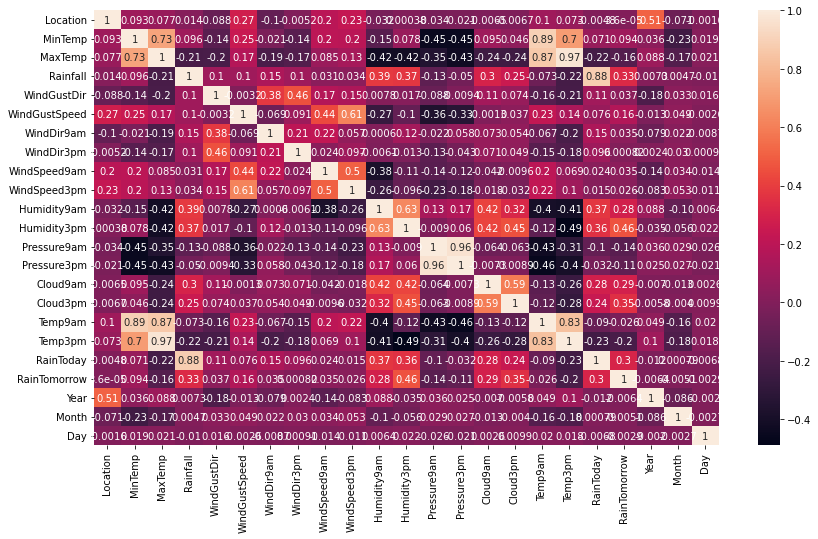

In [138]:
plt.figure(figsize=(14,8))
sns.heatmap(df_new.corr(),annot=True)

__Observations__<br>
- MinTemp and MaxTemo are correlated with the value of 0.73
- HUmidity9am and Humidity3pm are also correlated with the value of 0.63
- Pressure9am and Pressure3Pm are also correlated with the value of 0.96
- Temp9am And MinTemp are also correlated with the value of 0.89
- Temp3pm and MaxTemp are also correlated with the value of 0.97
- Temp 3pm and Temp9am are also correlated with the value of 0.83



In [139]:
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [141]:
def calc_vif(x):
    vif=pd.DataFrame()
    vif['variables']=x.columns
    vif['vif factor']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [143]:
calc_vif(xr)
#checking vif for columns only

,variables,vif factor
0,Location,4.552625
1,MinTemp,57.888196
2,MaxTemp,443.756201
3,WindGustDir,4.013444
4,WindGustSpeed,23.223881
5,WindDir9am,4.608523
6,WindDir3pm,5.749965
7,WindSpeed9am,11.120492
8,WindSpeed3pm,8.936068
9,Humidity9am,66.529410


In [ ]:
__Pressure9am,'Pressure3pm',Year,MaxTemp are having high VIF values so we can drop thee columns from our dataset__

In [145]:
xr_new=xr.drop(['Pressure9am','Pressure3pm','Year','MaxTemp'],axis=1)
xr_new.shape

(6460, 18)

In [146]:
#checking again vif
calc_vif(xr_new)

,variables,vif factor
0,Location,4.524901
1,MinTemp,45.748861
2,WindGustDir,3.960053
3,WindGustSpeed,19.866589
4,WindDir9am,4.329493
5,WindDir3pm,5.288193
6,WindSpeed9am,9.934014
7,WindSpeed3pm,8.828698
8,Humidity9am,57.703461
9,Humidity3pm,42.081125


__lets drop Temp9am, Humidity9am,Location  as well__

In [147]:
xr_new=xr_new.drop(['Temp9am','Humidity9am','Location'],axis=1)
xr_new.shape

(6460, 15)

## Scaling the features (xr_new)

In [148]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(xr_new)
X_scaled.shape

(6460, 15)

### Finding the best random state for building Regression Models

In [149]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    Xr_train, Xr_test, Yr_train, Yr_test = train_test_split(X_scaled, yr, test_size=0.25, random_state=i)
    lr=LinearRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(Y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best R2 score is", maxAccu,"on Random State", maxRS)

Best R2 score is 0.8031157143630386 on Random State 1


In [150]:
Xr_train, Xr_test, Yr_train, Yr_test = train_test_split(X_scaled, yr, test_size=0.25, random_state=1)


In [151]:
def reg(model, X_scaled, yr):
    Xr_train, Xr_test, Yr_train, Yr_test = train_test_split(X_scaled, yr, test_size=0.25, random_state=1)

    # Training the model
    model.fit(Xr_train, Yr_train)
    
    # Predicting Y_test
    pred = model.predict(Xr_test)
    
    # MSE - a lower RMSE score is better than a higher one
    mse = mean_squared_error(Yr_test, pred)
    print("MSE Score is:", mse)
    
    #RMSE
    print("RMSE Score is:", np.sqrt(mse))
    
    # R2 score
    r2 = r2_score(Yr_test, pred)*100
    print("R2 Score is:", r2)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X_scaled, yr, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of r2 score minus cv score
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)

## LinearRegression()

In [152]:
model=LinearRegression()
reg(model, X_scaled, yr)

MSE Score is: 0.17056039282177454
RMSE Score is: 0.41298957955591875
R2 Score is: 78.71365342358972
Cross Validation Score: 78.04916643554378
R2 Score - Cross Validation Score is 0.6644869880459368


## Ridge

In [153]:
model=Ridge()
reg(model, X_scaled, yr)

MSE Score is: 0.17056159345736155
RMSE Score is: 0.4129910331440158
R2 Score is: 78.71350358138548
Cross Validation Score: 78.04928112847581
R2 Score - Cross Validation Score is 0.6642224529096694


## Lasso

In [154]:
model=Lasso()
reg(model, X_scaled, yr)

MSE Score is: 0.801993805976493
RMSE Score is: 0.8955410688385502
R2 Score is: -0.09075274579539716
Cross Validation Score: -0.5976241043190811
R2 Score - Cross Validation Score is 0.5068713585236839


## SVR

In [155]:
model=SVR()
reg(model, X_scaled, yr)

MSE Score is: 0.18306408495259213
RMSE Score is: 0.4278598893944046
R2 Score is: 77.15316262160479
Cross Validation Score: 75.436965020052
R2 Score - Cross Validation Score is 1.7161976015527927


## DecisionTreeRegressor

In [156]:
model=DecisionTreeRegressor()

reg(model, X_scaled, yr)

MSE Score is: 0.3178258413738687
RMSE Score is: 0.5637604467979894
R2 Score is: 60.33457182821598
Cross Validation Score: 52.59316089142707
R2 Score - Cross Validation Score is 7.74141093678891


## RandomForestRegressor

In [157]:
model=RandomForestRegressor()
reg(model, X_scaled, yr)

MSE Score is: 0.16776780988562282
RMSE Score is: 0.4095946897673636
R2 Score is: 79.06217447961478
Cross Validation Score: 77.09500049548036
R2 Score - Cross Validation Score is 1.9671739841344191


## KNeighborsRegressor

In [158]:
model=KNeighborsRegressor()
reg(model, X_scaled, yr)

MSE Score is: 0.19633219459490472
RMSE Score is: 0.44309388914191167
R2 Score is: 75.49727067865412
Cross Validation Score: 74.08006186762351
R2 Score - Cross Validation Score is 1.417208811030605


## GradientBoostingRegressor

In [159]:
model=GradientBoostingRegressor()
reg(model, X_scaled, yr)

MSE Score is: 0.16856754034709961
RMSE Score is: 0.410569775247886
R2 Score is: 78.96236619769734
Cross Validation Score: 77.92989806660746
R2 Score - Cross Validation Score is 1.0324681310898711


## AdaBoostRegressor

In [160]:
model=AdaBoostRegressor()
reg(model, X_scaled, yr)

MSE Score is: 0.18270085125779295
RMSE Score is: 0.42743520123849527
R2 Score is: 77.19849505891808
Cross Validation Score: 75.64098781665815
R2 Score - Cross Validation Score is 1.5575072422599305


__Lets Select Ridge model this time and tune the paraameter__

## Ridge Model without Hypertuning

In [165]:
rg= Ridge()
rg.fit(Xr_train,Yr_train)
predrg=rg.predict(Xr_test)
mse = mean_squared_error(Yr_test, predrg)

print("MSE Score is:", mse)
print("RMSE Score is:", np.sqrt(mse))

r2 = r2_score(Yr_test, predrg)
print("R2 Score is:", r2)

MSE Score is: 0.17056159345736155
RMSE Score is: 0.4129910331440158
R2 Score is: 0.7871350358138548


## Hypertuning the Parameter

In [168]:
alp=np.random.uniform(low=0, high=100, size=(50,))
par={'alpha':alp,'fit_intercept':[True,False],
         'normalize':[True,False],
         'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs'],
         'positive':[True,False]}
gr=GridSearchCV(rg,param_grid=par)
gr.fit(Xr_train,Yr_train)


GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': array([95.13426549, 21.21913241, 59.56644748, 96.65290455, 23.37915969,
       23.11802512, 30.18462144, 17.86781256, 22.28695517, 74.21393794,
       51.86806901, 28.86324079, 68.69407727, 16.2016038 , 68.03430102,
        1.51551577, 70.37857361, 73.89877972, 72.38741669,  1.32583537,
       15.85128519, 15.16089832, 27.29110666, 56.12087901, 96.4947...
       38.38710693,  8.83427497, 25.74739893, 93.66311578,  0.72387127,
       81.26268558, 50.8769372 , 60.73509643, 46.56652372, 50.72629013,
       87.97808073, 91.05087316, 74.92416102, 81.2344837 , 37.6028602 ,
       10.83962506, 17.81615597, 71.87444068, 30.37609232,  8.92539429]),
                         'fit_intercept': [True, False],
                         'normalize': [True, False], 'positive': [True, False],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga', 'lbfgs']})

In [169]:
print("Best score:",gr.best_score_)
print("Best estimator:",gr.best_estimator_)
print("Best parameters:",gr.best_params_)

Best score: 0.7798434528864933
Best estimator: Ridge(alpha=16.201603796164765, normalize=False, solver='sag')
Best parameters: {'alpha': 16.201603796164765, 'fit_intercept': True, 'normalize': False, 'positive': False, 'solver': 'sag'}


## Ridge Model with Hypertuning

In [179]:
ridge=Ridge(alpha=68.03430102, normalize=False, solver='sag')
ridge.fit(Xr_train,Yr_train)
pred_final=ridge.predict(Xr_test)
mse = mean_squared_error(Yr_test, pred_final)

print("MSE Score is:", mse)
print("RMSE Score is:", np.sqrt(mse))

r2 = r2_score(Yr_test, pred_final)
print("R2 Score is:", r2)

MSE Score is: 0.1707595401170338
RMSE Score is: 0.41323061372196734
R2 Score is: 0.786887993629458


__Still GradientBoostRegressor(Features selected by SelectKBest Technique) is giving better result(R2 Score is: 0.8166) than Ridge(Features were selected manually )'s R2 Score is: 0.786887993629458__<br>
__So I am selecting GradientBoostRegressor as a final model.__<br>

### Visualising the final model

In [183]:
gbr_final.fit(X_train,Y_train)
train_gbr=gbr_final.predict(X_train)
predgbr=gbr_final.predict(X_test)

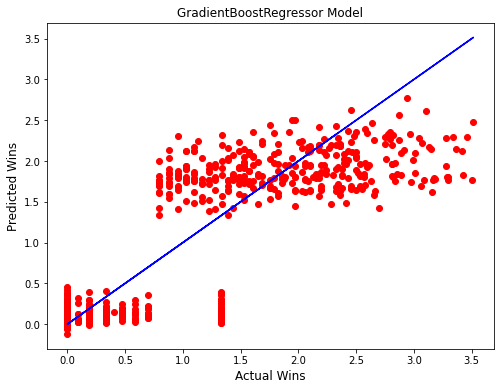

In [184]:
plt.figure(figsize=(8,6))
plt.scatter(x=Y_test,y=predgbr,color='r')
plt.plot(Y_test,Y_test,color='b')
plt.xlabel("Actual Wins",fontsize=12)
plt.ylabel("Predicted Wins",fontsize=12)
plt.title("GradientBoostRegressor Model")
plt.show()


## Saving the final model

In [187]:
import pickle

In [188]:
filename=('Rainfall-prediction-Regression.pkl')


In [189]:
pickle.dump(gbr_final,open(filename,'wb'))


In [191]:
#conclusion
loaded_model=pickle.load(open('Rainfall-prediction-Regression.pkl','rb'))
result=loaded_model.score(X_test,Y_test)
print(result*100)

81.64183572589036


__our final model is giving me 83% approx accuracy__

In [193]:
conclusion=pd.DataFrame([loaded_model.predict(X_test)[:],predgbr[:]],index=['Predcited','Orignal'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1605,1606,1607,1608,1609,1610,1611,1612,1613,1614
Predcited,2.424212,0.062384,0.050593,0.05789,0.148638,0.057854,1.946868,0.002622,0.002495,0.084745,...,0.021821,1.809327,0.054013,0.101115,0.057704,1.391137,0.019806,1.568959,0.106253,0.093754
Orignal,2.424212,0.062384,0.050593,0.05789,0.148638,0.057854,1.946868,0.002622,0.002495,0.084745,...,0.021821,1.809327,0.054013,0.101115,0.057704,1.391137,0.019806,1.568959,0.106253,0.093754


### Steps: I Followed in the above Dataset.
- Imported the required libraries

- loaded the dataset and checked for shape,datatype information, columns and checked for null /missing value(if any) and took the neccessary step

- Checked for unique values count and plot a bar of it(count plot)

- Described the dataset using .describe() method and wrote down the observation for min, max, mean ,std and skewness.

- Visulise the relationship between features and label using different plots

- Encoded categorical columns using encoding techniq and convreted object datatype into int datatype

- Used zscore() method to remove outliers and again checked for skewness and found skewness in dataset so used np.log() method and again chekd for skewness .

- Checked for Multicoliearity and cooreation using .corr() method and heatmap plot and dropped the highly correlated fetures( if any)

- Used SelectKBest teachnique for feature Selecteion (top 14 features)


- Plotted pairplot as well

### Task 1- To forecast whether or not it will rain tomorrow. (Classification Problem)

- Split the dataset into features and label and applying transormation on feature using StandardScaler method.

- Balanced the label column using SMOTE technique

- Scaled the features using StandardScaler

- Found the best random_state and wrote down single function for mulitple model evaluation.

- Evaluate the different models based on score, f1score

- Calculated CV score and selected the best model which had least difference between accuracy and CV score(KneighborsClassifier).

- Hypertuned the parameter using GridsearchCV and again calculated the scores but  accuracy score didnot increased for LogisticRegression(0.8192 reaimed the same) Model so I choose the next best model KNeighborsClassisfier and Tuned the parameter and Our Accuracy got increased from 0.84 to 0.86 and then saved the model with hypertuned parameter(KneighborsClassifier)

- Plotted AUC ROC curve

- printed confusion Matrix

- Saved the model using pickle library

- Compared the predicted and Original values

### Task 2- to predict how much rainfall could be there.(Regression Problem)

 - Split the dataset into features and label(Rainfall) and applying transormation on feature using StandardScaler method.

- Scaled the features using StandardScaler

- Found the best random_state and wrote down single function for mulitple model evaluation.

- Evaluate the different models based on R2 score and mean_squred_error

- Calculated CV score and selected the best model which had least difference between r2 and CV score __(GradientBoostClassifier)__.

- Hypertuned the parameter using GridsearchCV and again calculated the accuracy but  accuracy score did increased very little so __I again Select the features manually depending upon the Coorealtion value and vif values__

- I dropped the higher vif's columns and again Split the dataset into features and label(Rainfall) and applying transormation on feature using StandardScaler method.

- Found the best random_state and wrote down single function for mulitple model evaluation.

- Evaluate the different models based on R2 score and mean_squred_error

- Calculated CV score and selected the best model which had least difference between r2 and CV score(This time Ridge(r2-78.88).
- Hypertuned the parameter using GridsearchCV and again calculated the accuracy but  accuracy score did not change much(78.68)

__After comparing both model(GradientBoostRegressor and Ridge) , I select GradientBoostRegressor as our final model__

- Visualize the model

- Saved the model using pickle library

- Compared the predicted and Original values